***Weather Data Analysis: A Regression and Classification Approach on the ERA5 Dataset***

Course: <b>Data Analytics with Statistics</b> | lecturer: <b>Prof. Dr. Jan Kirenz</b> | Name: <b>Julian Erath, Furkan Saygin, Sofie Pischl</b> | Group: <b> B</b> 

# Introduction and data
## Motivation
Weather, an age-old Earth phenomenon, captivates human interest due to its intricate blend of temperature, wind, and precipitation, molding our surroundings and challenging our understanding of the natural world [^1]. Accurate weather prediction is crucial for agriculture, disaster management, and urban planning, particularly in the context of climate change risks [^2]. The project, titled "Weather Data Analysis: A Regression and Classification Approach on the ERA5 Dataset" aims to contribute to this exploration by examining how different variables interact to create complex weather phenomena.

## Data
**Data description of sample**  
The study leverages the ERA5 dataset, sourced from the European Centre for Medium-Range Weather Forecasts (ECMWF), is comprised of atmospheric reanalysis data spanning multiple decades (2015-2022) at hourly intervals and characterized by a spatial resolution of approximately 31 km  [^3]. The data is collected through reanalysis, assimilating observational data from satellites, weather stations, and other sources into a numerical weather prediction model. Focusing on the region of Bancroft in Ontario, Canada, the project explores the unique climatic and meteorological characteristics of the area, influenced by the 'lake-effect' phenomenon [^4]. Various meteorological parameters as described below are included in the dataset. The data, labeled by meteorologists and data scientists from IBM and The Weather Company, offers comprehensive global-scale atmospheric information, making it well-suited for detailed analyses and modeling, including climate research, environmental monitoring, and weather forecasting [^5], [^6].

**Variables**  
The dataset, encompasses key variables such as air temperature, wind speed and direction, precipitation, atmospheric pressure, snow density, cumulative snow, cumulative ice, and weather events. The dataset also includes categorical weather events such as 'Blue Sky Day', 'Mild Snowfall', and 'Storm with Freezing Rain'. These variables form the foundation for the assignment's comprehensive analysis [^7].

**Overview of data**  
Initially, the .csv file is loaded, and the data's head is printed for an initial overview of columns (variables) and rows (observations), as can be seen in appendix 5.2 "Display of the Used Dataframe". The dataset comprises 65,345 observations and 186 columns, including unique predictor variables and a response variable. A new dataframe is formed by selecting specific columns and transforming columns (based on analysis for feature relevance and literature) to achieve optimized resource usage. This dataframe is later split into training, testing, and validation sets, underlining the foundational role of proper data splitting for reliable machine learning model development and generalization to new data [^8], [^9].

In [1]:
# import dependencies 
import pandas as pd
import numpy as np
import datetime
import matplotlib.dates as mdates
import math
import matplotlib.pyplot as plt
from matplotlib import rcParams
import matplotlib.gridspec as gridspec
import seaborn as sns
from sklearn.preprocessing import StandardScaler
import warnings
from sklearn import svm
from sklearn.model_selection import train_test_split
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error, classification_report, confusion_matrix, accuracy_score, precision_score, recall_score, f1_score
from sklearn.linear_model import LinearRegression, LogisticRegression, SGDRegressor
from sklearn.ensemble import GradientBoostingRegressor, GradientBoostingClassifier, ExtraTreesClassifier, RandomForestClassifier, GradientBoostingClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVR
from scipy.stats import zscore
from sklearn.pipeline import make_pipeline
from xgboost import XGBClassifier
from lightgbm import LGBMClassifier
from statsmodels.tsa.statespace.sarimax import SARIMAX
from statsmodels.tsa.seasonal import seasonal_decompose
import statsmodels.api as sm
import pickle
from sklearn.tree import plot_tree
from tabulate import tabulate
import plotly.express as px
from sklearn.decomposition import PCA
warnings.filterwarnings("ignore")

#import data
df_full = pd.read_csv("../data/external/feature_data_substation_bancroft_labelled.csv")

# Data Corrections
# Change datetime columns to datetime format
df_full['run_datetime'] = pd.to_datetime(df_full['run_datetime'])
df_full['valid_datetime'] = pd.to_datetime(df_full['valid_datetime'])

# Add temperature column for degree in celsius
df_full['avg_temp_celsius'] = df_full['avg_temp'] - 273.15

# Translate wind directions into cardinal directions
def wind_direction_label(degrees):
    if 22.5 < degrees <= 67.5:
        return 'Northeast'
    elif 67.5 < degrees <= 112.5:
        return 'East'
    elif 112.5 < degrees <= 157.5:
        return 'Southeast'
    elif 157.5 < degrees <= 202.5:
        return 'South'
    elif 202.5 < degrees <= 247.5:
        return 'Southwest'
    elif 247.5 < degrees <= 292.5:
        return 'West'
    elif 292.5 < degrees <= 337.5:
        return 'Northwest'
    else:
        return 'North'
    
df_full['wind_direction_label'] = df_full['avg_winddir'].apply(wind_direction_label)


## Research Questions
The research is guided by six pivotal questions, addressed through regression and classification analyses.

**Regression Hypothesis:** There exists a significant correlation between temperature and wind characteristics, which can be modeled to predict future temperature trends and variations. This hypothesis is based on the premise that atmospheric variables are interconnected and can be analyzed to forecast weather conditions. The hypothesis will be examined through the following questions: Is it possible to build an accurate regression model to predict temperature based on historical data? Is it possible to find a correlation or causation between the temperature and the wind features using regression techniques?  How does the incorporation of multiple atmospheric predictors enhance the accuracy of temperature prediction compared to a model solely based on windspeed? Can logistic regression effectively classify and predict the occurrence of extreme or normal weather events based on temperature ranges? 

**Classification Hypthesis:** Specific patterns in the weather data can accurately predict various weather events, including extreme conditions. This hypothesis is informed by the need for effective prediction models in the face of increasingly frequent and severe weather events. The following questions will help to evaluate this hypothesis:  Is it possible to binary classify and predict extreme weather events such as storms? Is it possible to categorize and predict different extreme weather events based on multivariate weather data? 

## Exploratory Data Analysis (EDA)
The dataset includes features such as the substation (Bancroft), timestamps, weather-related parameters, and various labels for the corresponding weather events.
As revealed in the appendix 5.3 "Data Dictionary" most variables are of the "float64" data type (167), 8 variables are of type "int64", 9 are of type "object", and 2 are "datetime64". 
First, the variable "avg_temp" is examined. This includes depicting the temperature trend over time (seen in 5.4 "Time series"), as well as displaying the box plot and histogram as shown in appendix 5.8 "Distribution of Weather Features by Weather Event Profiles in Distograms" and 5.9 "Distribution of Weather Features by Weather Event Profiles in Boxplots".

# Methodology

The first phase of methodology is focused on the comprehensive preparation and processing of the ERA5 dataset to ensure a solid basis for the subsequent analysis. This phase aims to ensure data quality and maximize the accuracy of the models.

**Data acquisition**  
After import and inspection, the date and time information in the dataset is converted into a standardized date format. Some data correction is performed.
As a result of this phase, the dataframe with the variables as seen in 5.2 "Display of the Used Dataframe" is created and used in the further analysis. 

## Analysis and Visualisation
Weather event analysis shows 'blue sky day' as the most common, followed by mild and moderate snowfall, then moderate rainfall. Extreme events like storms with freezing rain and heavy snow, as well as high precipitation snowstorms, are significantly less frequent.

The weather data time series analysis for Bancroft shows (appendix 5.4 "Time series"):
- Temperature: Distinct annual cycle with high summer and low winter temperatures, and moving averages smoothing daily fluctuations.
- Wind: High daily variability in speed and direction, with no clear seasonal patterns, indicating complex local weather dynamics.
- Snowfall: Clear seasonal trend, inversely related to temperature, with increasing density over time.
- Pressure: Mirrors temperature changes, suggesting a strong seasonal relationship.

Histogram analysis reveals (appendix 5.8 "Distribution of Weather Features by Weather Event Profiles in Distograms"):
- Temperature: Bimodal distribution with more frequent cooler periods.
- Wind: Predominantly moderate conditions with occasional strong gusts.
- Precipitation: Mostly minor events, with rare heavy rainfall.
- Snow and Ice: Significant accumulations are rare.
- Pressure: Consistent, with little fluctuation.

Boxplot analysis of weather parameters confirms previous findings (appendix 5.9 "Distribution of Weather Features by Weather Event Profiles in Boxplots"): clear seasonal temperature fluctuations, mostly low wind speeds with occasional peaks, generally low precipitation with rare high outliers, infrequent snow and ice accumulations, and stable atmospheric pressure. 

Distogram and box plot analyses of weather events in Bancroft yield insights into weather parameter influences:
- Temperature: 'Blue sky days' correlate with higher temperatures, while colder temperatures are associated with snowfall events. All events can occur at median temperatures.
- Temperature Changes: Symmetric distribution around zero suggests temperature changes are not reliable predictors for weather events.
- Wind: Wind speed and gusts poorly differentiate events, but certain patterns are noted in average wind direction. Wind alone is not a strong predictor.
- Precipitation, Snow, Ice: Skewed distribution towards light events with rare intense occurrences. Related variables like snow accumulation help distinguish events like snowfall.
- Atmospheric Pressure: Relatively normal distribution, indicating a stable environment.

Box plot findings include:
- Clear Skies: High average temperatures, low precipitation.
- Continuous Freezing Rain: Narrow temperature ranges, variable pressure changes.
- Snowfall Variations: Low temperatures with varying snow and ice accumulations.
- Moderate Rain and Snow: Variable temperatures and precipitation amounts.
-Severe Storms: Extreme precipitation, significant temperature and pressure fluctuations, variable wind conditions.

Pie-chart findings (appendix 5.6 "Distribution of All Weather Events"): 
- Overall Weather Event Distribution: 'Blue Sky Day' dominates with 77.9% of observations, indicating prevalent clear weather. Moderate rain, light and moderate snowfall are less common but notable.
- Extreme Weather Event Distribution: Among non-clear sky observations, moderate snowfall is most frequent (35.4%). Moderate snowfall (23.0%) and moderate rain (20.7%) follow, together accounting for 79.1% of these events. The remaining 20.9% comprises rarer, more extreme events like heavy snowfall, continuous freezing rain, and storms with freezing rain or heavy snow, listed in order of frequency.

Scatterplot analysis and correlation coefficients revealed (appendix 5.7 "Association Plots and Correlation Analysis"):
- Similar-Scale Correlations: Stronger correlations were found between variables with similar scales and units, like average temperature, dew point, temperature change, - minimum wet bulb temperature, and between average wind speed and maximum wind gusts.
- Correlation Variability: Correlations between parameters varied significantly during extreme weather events, indicating their substantial impact on these relationships.

In Bancroft's climate study (appendix 5.10 "Analysis of Wind Speeds and Average Temperatures by Wind Direction"):
- Temperature and Wind in Regression: Temperature and wind parameters were included in regression analyses despite no direct linear correlation, acknowledging possible non-linear influences.
- Key Findings: Wind speed varies by direction, with higher speeds in north/west winds and lower in southeast/east. Southwesterly winds bring warmer temperatures, while northerly winds are cooler.

The Principal Component Analysis (PCA) of Bancroft's weather data revealed (5.11 "3D plot of all weather observations using PCA"):
- Data Point Distribution: A cone-shaped structure along the PC1 and PC2 axes suggests these components capture most weather variability.
- Event Characterization: Specific events like "Storm with freezing rain / Heavy snow and ice storm" are outliers, extending prominently on PC1 and PC2, while "Blue Sky Day" shows wide variability, clustering below 0 on PC1 and between -5 and 10 on PC2.
- Clustering: A dense cluster near the origin indicates that frequent weather conditions share similar features like average temperature and precipitation, contrasting with the extended tail and outliers that represent rare and extreme events.
- Interpretation Challenges: Difficulty in separating clusters, especially within PC3, due to subtle differences, and a significant overlap in PC1, highlighting the complexity of differentiating weather patterns.

## Model
### Regression Analysis Temperature and Wind
A linear regression, gradient boosting, SGD regressor, and support vector regressor were trained to predict average wind speed using variables from the EDA. The training-to-test data ratio was 80:20, with model evaluation based on MSE and MAE.

Key Findings:
- Weak Relationship Between Wind Speed and Temperature: Scattered data points and high MSE/MAE values across models suggest a limited predictive accuracy of temperature from wind speed alone.
- Residual Analysis: Wide spread of residuals, especially in the Support Vector Regression model, indicates substantial prediction errors and a tendency to underpredict temperatures.
- Model Performance and Bias: Most models show no significant bias, but the complexity of temperature patterns requires multiple regression with additional variables.
- Linear Relationship in Specific Cases: Simple regression between closely linked variables like wind speed and gusts shows lower MSE and MAE, but may offer limited scientific value due to inherent correlations.
The analysis emphasizes the need for multiple factors in modeling complex systems like weather patterns and highlights the importance of interpreting model results carefully, considering the environmental data's complexity.

###  Regression Analysis Multiple Linear Regression
The objective is to predict temperature using multiple predictors, with a focus on feature selection to ensure insights and minimal correlation between variables. Key findings from the correlation analysis include:

High correlation among temperature-related variables like 'avg_temp', 'avg_temp_celsius', 'min_wet_bulb_temp', and 'avg_dewpoint'.
Moderate correlation between 'avg_windspd' and 'max_windgust', but low correlation with temperature variables.
Low correlation for wind direction variables like 'avg_winddir'.
Moderate to high correlation among precipitation variables such as 'max_cumulative_precip', 'max_snow_density_6', and 'max_cumulative_snow'.
Negative correlation between 'avg_pressure_change', 'avg_temp', and 'label1'.
Redundant variables were removed, and a feature forward selection identified nine key variables, including 'max_snow_density_6', 'avg_temp', and 'avg_windspd', enhancing model accuracy. Backward feature elimination retained all selected features, achieving an accuracy of 99.969%.
Training with the optimized dataset included a linear regression model using 'avg_windspd' and 'avg_winddir' to predict average temperature. Another model utilized all variables for performance comparison. The target variable was then changed to predict average wind direction using all available variables, with results discussed in the Results chapter, using metrics like MSE, MAE, and R-squared.

### Regression Analysis Temperature Forecast
A SARIMAX model visualizes avg_temp, avg_winddir, avg_windspd, and avg_windgust, including time series, trend, seasonal, and residual components. The Augmented Dickey-Fuller test ensures these time series are stationary, critical for SARIMAX model accuracy. Model selection relies on the Akaike Information Criterion (AIC) and Bayesian Information Criterion (BIC) to balance fit and complexity, with lower values indicating better models.
AutoARIMA optimizes ARIMA model parameters (p, d, q) for this dataset, focusing on daily seasonality (m=24) and model simplicity. It aims to model data patterns effectively without overfitting.
The diagnostic phase assesses the SARIMAX model's fit, confirming its ability to capture data patterns and validating assumptions like the normal distribution of residuals and no autocorrelation for robustness and reliability.
Lastly, the model is refitted with revised parameters and evaluated on the test dataset using AIC, BIC, MSE, and SSE values.
The optimal model for this project is identified using Lazypredict, which compares multiple models' performance. The XGBRegressor is chosen for predicting average temperature from wind speed and direction. TimeSeriesSplit is used for cross-validation to assess the model's effectiveness on unseen data, with hyperparameters fine-tuned for a balance between complexity and accuracy. The model's performance is evaluated using MSE, MAE, and visualizations of actual versus predicted values.
Next, a regression model is developed to predict temperature based on historical data, including daytime, day, and season. Multiple models - linear regression, gradient boosting, SGD regressor, and SVR regressor - are considered, with the train-test split based on the year of data. These models are evaluated by their residuals and visualized for actual versus predicted values, with detailed discussions in the 'results' chapter.

### Logistic Regression
To predict extreme weather events with the temperature variable, the project uses logistic regression. First it is required to normalize the data and choose a constant, which which is done by the statsmodels in this case. After the fit of the data into the model we can evaluate it using the aic and the confusion matrix. A final visualization is helpful to understand the results und to find techniques to improve the performance.

### Binary Classification
The goal is to be able to predict extreme weather events by any variables. For that we first customize our datframe by drop columns, which are not numeric and not needed. After that ´label1´ is choosen as the dependend variable and lazypredict library is used to find the best model for this case. 'ExtraTrees', 'XGBoost', 'LGBM', 'RandomForest' were choosen as the best models for this case, which is why all of them are implemented. The individual confusion matrix are used to evaluate the model performance in combination with the precision, recall and f1-score metrics.

### Multiclass Classification
Now it is important to classify which extreme weather event it is in particular. Other classifier need to be trained, for this usecase knn, svm, dtc and gbc were chosen. And again the individual confusion matrix is used to evaluate the model performance in combination with the, precision, recall and f1-score metrics.

# Results
## Regression Results
Is there a significant correlation between temperature and wind characteristics, which can be modeled to predict future temperature trends and variations? This question was addressed within the scope of this project. Various regression techniques were employed, and different sub-questions were examined.

**Temperature and Wind Modeling**  
In the first step, the relationship between wind speed and temperature is investigated. In this context, models such as the Linear Regression Model (LRM), Gradient Boosting Model, Stochastic Gradient Descent Model, and Support Vector Regression Model are utilized to depict the correlation (appendix 5.12 "Linear Regression Analysis Temperature and Wind Modeling Results"). These models are predicting temperature from wind speed using various regression techniques and are compared with each other. Results show a weak correlation, high MSE, and MAE across all models, indicating poor prediction. Outliers and dispersed residuals suggest significant deviations. Support Vector Regression tends to underpredict. Findings suggest the need for multiple regression with additional variables. A subsequent linear regression analysis on wind gusts reinforces the idea that correlated variables may yield successful models but lack scientific value. Multiple regressor analysis is proposed to enhance temperature prediction due to the limited effectiveness of wind speed alone.

**Linear Regression Analysis with Multiple Predictors**  
In the initial phase of the Temperature and Wind Modeling over Time analysis, a Multiple Linear Regression is introduced, as introduced in the lecture. Based on that, the temperature variable is now predicted with improved accuracy using linear regression with multiple predictor variables, addressing the research question of how the incorporation of various atmospheric predictors enhances temperature prediction over different time scales, uncovering interactions and synergies among predictors, and analyzing temporal dynamics to refine the predictive model. The temperature is predicted on windspeed and wind direction in the first step. In the next step, the temperature is predicted using the before-utilized variables (appendix 5.13 "Linear Regression Analysis Multiple Predictors Correlation Matrix of Variables"). For this analysis seasonality and trend for the temperature are also analysed (appendix 5.14 "Linear Regression Analysis Multiple Predictors Seasonality and Trend"). After implementing the Multiple Linear Regression (MLR) model, there can be a lack of accuracy in predicting average temperature from wind speed and direction, as well as from the remaining variables. The overall conclusion underscores the need for further refinement, potentially involving additional features or non-linear models, to enhance predictive accuracy, especially in accurately predicting extreme temperatures.

**SARIMAX MODEL**  
After successfully predicting the temperature parameter through multiple predictor linear regression, the focus shifts to forecasting the temperature parameter with a statistical SARIMAX approach (appendix 5.15 "Linear Regression Analysis Multiple Predictors SARIMAX Forecast Results"). SARIMAX models are among the most widely used statistical models for forecasting, with excellent forecasting performance [^16]. To keep the model's complexity low and avoid lengthy computation times later on, only wind variables are used for an initial approach here. The analysis of Trend and Seasonality revealed a slight variability with some periods showing a gentle rise or fall and a consistent and expected cyclical pattern corresponding to the seasons. The augmented Dickey-Fuller Test (ADF) [^17], Akaike Information Criterion (AIC) [^18], and Bayesian Information Criterion (BIC) are performed on the data. The ADF Test indicated stationarity, the AIC and BIC showed that windspeed and winddirection are the most suitable predictors. After that, the actual SARIMAX Model is created. The evaluation reveals the model's limitations in capturing short-term fluctuations, particularly missing sharp peaks, and consistently overestimating temperatures, indicating a systematic bias and the need for further refinement or alternative modeling approaches to enhance accuracy.

**XGBoost**  
After implementing the SARIMAX as a popular approach for time series analysis, the Lazy Regressor library from sklearn was utilized to find the best-performing regressor. The Lazy Regressor showed that all Regression Models have a rather low R-Squared Value. The XGBoost Regressor is determined as the best-performing Model with an R-Squared Value of 0.13. Based on that, the XGBoost Model is used. The evaluation of the model shows a moderate level of predictive accuracy, with the model following the general temperature trend but exhibiting discrepancies in magnitude and timing, supported by reported Mean Squared Error (MSE) and Mean Absolute Error (MAE) values, suggesting potential for improvement through model tuning and additional feature exploration.

**Temporal Prediction**  
In the next step, the relationship between temperature and time is explored. A Linear Regression Model, Gradient Boosting Regressor, an SGD Regressor, and a Support Vector Regressor are used here. The Evaluation of the plots presents that the Gradient Boosting Regressor demonstrates a promising ability to closely track temperature changes with fewer deviations and a tighter distribution of residuals, supporting the conclusion that linear regression models, while not perfect, can provide valuable forecasts for temperature trends in Bancroft, Canada. The results can be seen in appendix 5.16 "Linear Regression Analysis Prediction Forecast Results".

**Temporal Logistic Regression**  
Logistic regression, placed between linear regression and classification chapters, serves as a bridge to better understand the data story, where blue dots represent actual labels, red dots indicate predicted probabilities, and the orange curve reflects the probability of extreme weather events based on temperature alone (appendix 5.17 "Logistic Regression Analysis Predicting WEP by Temperature Results"). The graph reveals significant overlap in temperature ranges for different event types, leading to high false positives and low recall. Consequently, logistic regression with temperature as the sole predictor is deemed insufficient for this classification task, suggesting the potential need for additional predictors, hyperparameter tuning, or alternative modeling approaches for improved performance.

**Conclusion**  
In conclusion, the investigation into the correlation between temperature and wind characteristics, with the aim of modeling future temperature trends and variations, has yielded valuable insights within the scope of this project. Employing various regression techniques, the exploration delved into different sub-questions surrounding this overarching hypothesis. The results indicate that while initial models, particularly those based solely on wind parameters, exhibited limitations in predictive accuracy, the incorporation of multiple predictors through advanced regression analyses showcased a promising avenue for refinement. The comprehensive evaluation underscores the complexity of the relationship between temperature and wind characteristics, emphasizing the need for nuanced modeling approaches and consideration of additional factors to enhance the precision of temperature predictions over diverse temporal scales. Overall, this study provides a foundation for future research endeavors seeking to unravel the intricate dynamics between meteorological variables and advance our understanding of climate forecasting.

## Classification Results
### Binary Classification of Extreme Weather Events
The visualization of the results of the binary classification can be found in appendix 5.18 "Methodology and Results Binary Classification" and displays four confusion matrices, each representing the performance of a different binary classification model: ExtraTrees, XGBoost, LightGBM, and RandomForest.
While all models demonstrate high accuracy, with a significant majority of instances correctly classified, which is indicative of their ability to discriminate between the two classes effectively, the LGBM classifier shows the least number of Type II errors, signifying its strength in identifying true extreme weather events with minimal misses. Conversely, the XGBoost classifier presents with the lowest Type I errors, suggesting it is more conservative in predicting extreme weather, thus minimizing false alarms. In practical applications, Type I errors can be particularly critical as they represent missed predictions of extreme weather, which are crucial for timely warnings and safety measures. Therefore, the XGBoost classifier might be preferred in scenarios where the cost of missing an actual extreme weather event is high. Each of these models offers a trade-off between sensitivity to detecting true events and specificity in avoiding false alarms, which needs to be carefully balanced according to the application's requirements and the consequences of prediction errors.

The classification reports found in appendix 5.18 provide an evaluation of the performance of different models. The ExtraTrees model demonstrates high precision and recall for both classes, achieving an accuracy of 99.30%. The precision, recall, and F1-score for both extreme weather events (0) and blue sky events (1) are consistently high, indicating robust performance across both classes. The XGBoost model exhibits excellent precision, recall, and F1-score for both classes, resulting in an overall accuracy of 99.40%. Similar to ExtraTrees, it shows strong performance in correctly classifying both extreme weather and blue sky events. The LightGBM model achieves a high accuracy of 99.37%, with impressive precision, recall, and F1-score for both classes. Notably, it maintains a high recall for extreme weather events (0), ensuring that a significant proportion of these events are correctly identified. The RandomForest model performs well, achieving an accuracy of 99.32%. It shows strong precision, recall, and F1-score for both extreme weather events (0) and blue sky events (1), indicating reliable performance across different weather scenarios.
In summary, all four models—ExtraTrees, XGBoost, LightGBM, and RandomForest—demonstrate robust performance in classifying weather events, with high accuracy and consistent precision and recall metrics across the evaluated classes.

### Multiclass Classification of Various Extreme Weather Events
After successfully predicting extreme weather and blue sky day weather events, a key result of this research is the prediction of specific extreme weather events. Once it is determined, that an observation is an extreme weather event, it's important to analyse what specific kind of extreme weather event it is. These results can then be used by scientists and governmental institutions to take countermeasures to prevent damage and minimize the risk for a weather event to be hazardous.
The analysis for the classification of specific weather events and patterns is conducted using multiclass classification techniques. The research question to be answered ist: Is it possible to categorize and predict different extreme weather events based on multivariate weather data? This involves using multiclass classification algorithms. The results of this classification analysis is the prediction of certain weather events based on the current weather data and a model that was trained on historical weather data.

The multiclass classification is conducted using the models K-Nearest Neighbors (KNN), Support Vector Machines (SVM), Decision Tree Classifier (DTC) and Gradient Boosting Classifier (GBC). These models have fundamentally different functionality so that the different model types can be compared with each other and strengths and weaknesses in the application to weather data can be assessed for each model type. The detailed results and visualisations for each model can be found in the appendix 5.19 "Methodology and Results Multiclass Classification".

KNN's multiclass classification performs well, aligning actual outcomes closely with predictions. The classification report highlights high precision and consistent recall, both with values between 78%-100% through all labels. The F1-score is strong for most classes, with a macro average of 0.88 and a weighted average of 0.92, demonstrating effectiveness despite class imbalance. The model's 92% accuracy underscores its reliability across diverse classes, showcasing robust performance in multiclass classification tasks.

The SVM displays a higher misclassification rate than KNN, particularly misclassifying Class 0 as Class 1. This discrepancy suggests challenges in distinguishing between these classes. The performance gap underscores the need to consider dataset characteristics when selecting a classification algorithm. The classification report indicates some performance variations. Precision for Class 0.0 decreases to 0.81, while recall for Class 1.0 improves to 0.69, leading to an increased F1-score of 0.52. Class 2.0 shows improved precision (0.78) but decreased recall (0.55), resulting in a slightly lower F1-score of 0.64. Class 4.0 sees increased precision (0.70) and a slight recall decrease (0.94), yielding a higher F1-score of 0.80. Macro-average precision and recall remain consistent at 0.75 and 0.77, contributing to a macro-average F1-score of 0.75. The weighted average F1-score is 0.82, indicating an overall improvement in balancing precision and recall with 82% accuracy.

The DTC excels in predicting various weather events, showing impressive performance across multiple metrics with high precision, recall, and F1-score. Particularly noteworthy is its perfect precision and recall for classes 3.0, 4.0, and 5.0. The overall accuracy of 95% highlights its effectiveness in classifying most instances. The Decision Tree's interpretability and simplicity, visualized through a decision tree plot, enhance transparency. However, in some scenarios, more advanced models may outperform it, and decision trees can be susceptible to overfitting.

The GBC Confusion Matrix highlights excellent performance with accurate predictions for most labels. The Classification Report demonstrates impressive precision, recall, and F1-score across diverse weather event classes, maintaining precision rates above 94%. Recall values consistently range from 92% to 100%, showcasing the classifier's ability to identify instances accurately. The 98% overall accuracy underscores its proficiency in classification. Compared to prior models, the Gradient Boosting Classifier excels in accuracy and balanced performance. Its use of multiple decision trees, akin to a random forest, enhances interpretability and simplicity while avoiding overfitting. Its capacity to handle complex relationships within the data makes it a robust choice for this classification task.

The analysis of the classification reports provides valuable insights into the performance of different classifiers across multiple weather event labels. The Extra Trees, XGBoost, and Random Forest classifiers consistently demonstrate high precision, recall, and F1-score across various weather event categories, showcasing their effectiveness in accurately predicting events. The SVM tends to misclassify events more frequently. The GBC and DTC emerge as top performers, providing accurate predictions across a diverse range of weather event labels. Generally, the results for the multiclass classification analysis are excellent, proofing that extreme weather events can be predicted with a very high accuracy using mutliclass classification techniques.

# Discussion and Conclusion

## Regression Analysis Findings
The regression analyses aimed to predict temperature using historical data, achieving satisfactory accuracy in general temperature trend forecasts for the year with linear regression models. The Support Vector Regressor emerged as the most effective model. However, attempts to predict temperature with wind speed in linear regression or a mix of variables in multiple predictor linear regression were unsuccessful. The non-linear relationship and insufficient correlation between temperature and wind variables led to the decision to explore logistic regression and classification techniques. The SARIMAX model used for temperature and wind modeling exhibited a consistent bias, overestimating temperatures, highlighting limitations and prompting the need for alternative modeling approaches. The final regression analysis employed logistic regression to classify extreme weather and clear sky events. However, the approach based solely on temperature was insufficient, emphasizing the need for more complex or multivariate methods to accurately predict hazardous weather conditions. Instead of optimizing logistic regression further, the focus shifted to identifying additional binary classifiers in subsequent classification analyses.

## Classification Analysis Findings
In binary classification the goal was to predict whether an observation was an extreme weather or blue sky day event. The research question was "Is it possible to classify and predict extreme weather events such as storms?". It was identified that extreme weather events can indeed very accurately be separated from blue sky day events and both classes can be predicted with a very high accuracy, precision and recall. "ExtraTreesClassifier," "XGBClassifier," "RandomForestClassifier," and "LGBMClassifier" are the top-performing classifiers based on LazyClassifier's assessment. Each demonstrated high accuracy, with XGBoost slightly leading the pack. These models proved effective in categorizing and predicting weather events from the given data, providing valuable tools for future weather prediction endeavors. The results of this analysis could then be used in multiclass classification, to determine the specific type of extreme weather event.

The multiclass classification further nuanced the understanding of various weather events. The goal was to determine and classify the specific type of extreme weather event, answering the research question "Is it possible to categorize and predict different extreme weather events based on multivariate weather data?". The research question can be answered with yes, the prediction and categorization of various extreme weather events is possible with a very high accuracy, precision and recall. Gradient boosting emerged as a particularly potent method, achieving high precision, recall, and F1-scores across all classes. This success illustrates the potential of sophisticated classification algorithms in deciphering complex weather patterns and predicting diverse weather events. This knowlegde can then also be used by scientists for further research for governmental institutions, e.g., when it comes to taking countermeasures to prevent damage from certain extreme weather events and minimize the risks and dangers.

## Critical reflection and outlook
This project delved into regression and classification analyses of weather data in Bancroft, Ontario, offering insights into atmospheric dynamics. Despite challenges and complexities in meteorological studies, the pursuit of accurate weather prediction demands ongoing model refinement. The absence of linear correlation between wind and temperature variables, as revealed in the EDA, could have led to discontinuation, but the value found in literature influenced the decision to persist. The approach, including PCA and feature selection, provided interesting results, adding value to the scientific discourse.
However, the regional bias in the data and the irregular nature of meteorological phenomena emphasize the challenges in making precise predictions. While the analyses presented valuable insights, further optimization, including hyperparameter tuning, remains a potential avenue. Exploring weather patterns and their relationship to climate change could expand understanding, acknowledging potential sources of variance and errors.
Recognizing the limitations and external factors influencing weather trends adds humility to the findings, urging future researchers to explore additional dimensions. Despite the contributions to weather prediction, the complexities of meteorological studies and unpredictable weather dynamics necessitate continual refinement and consideration of broader environmental factors.
In summary, this project contributes to weather prediction discourse, highlighting the need for multidimensional approaches and the potential of machine learning techniques. As climate variability poses challenges, these insights pave the way for more accurate and comprehensive forecasting methods. Integrating diverse datasets, refining models, and exploring new methodologies are crucial for better forecasting, strategic planning, and preparedness across sectors in the face of weather and climate change impacts.


# Apendix

## Simple Exploratory Data Analysis

In [2]:
df_full.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 65345 entries, 0 to 65344
Columns: 186 entries, Unnamed: 0 to wind_direction_label
dtypes: datetime64[ns](2), float64(167), int64(8), object(9)
memory usage: 92.7+ MB


In [3]:
df_full.describe().T

,count,mean,min,25%,50%,75%,max,std
Unnamed: 0,65345.0,32685.658321,0.0,16343.0,32689.0,49025.0,65361.0,18867.701277
run_datetime,65345,2019-04-06 14:09:11.362766848,2015-07-15 00:00:00,2017-05-25 23:00:00,2019-04-07 01:00:00,2021-02-14 16:00:00,2022-12-27 08:00:00,NaN
valid_datetime,65345,2019-04-06 14:09:11.362766848,2015-07-15 00:00:00,2017-05-25 23:00:00,2019-04-07 01:00:00,2021-02-14 16:00:00,2022-12-27 08:00:00,NaN
horizon,65345.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
avg_temp,65345.0,279.574328,243.849393,271.114219,279.882735,289.903226,300.934144,11.383325
...,...,...,...,...,...,...,...,...
label2,12712.0,3.06191,0.0,1.0,3.0,5.0,6.0,2.126446
label3,65345.0,1.1811,0.0,1.0,1.0,2.0,3.0,0.740687
year,65345.0,2018.745535,2015.0,2017.0,2019.0,2021.0,2022.0,2.162032
month,65345.0,6.711852,1.0,4.0,7.0,10.0,12.0,3.446477


## Display of the Used Dataframe

In [4]:
#Creating a new dataframe with only the used columns (saves resources)
columns_to_keep = [
    'run_datetime',
    'wep',
    'avg_temp',
    'avg_temp_celsius',
    'min_wet_bulb_temp',
    'avg_dewpoint',
    'avg_temp_change',
    'avg_windspd',
    'max_windgust',
    'avg_winddir',
    'avg_winddir_sin',
    'avg_winddir_cos',
    'wind_direction_label',
    'max_cumulative_precip',
    'max_snow_density_6',
    'max_cumulative_snow',
    'max_cumulative_ice',
    'avg_pressure_change',
    'label0', #additional wep labels for various blue sky events
    'label1', #additional wep labels to differentiate between blue sky and extreme weather events
    'label2'
]

# Use loc to select only the specified columns
df = df_full.loc[:, columns_to_keep]
df

,run_datetime,wep,avg_temp,avg_temp_celsius,min_wet_bulb_temp,avg_dewpoint,avg_temp_change,avg_windspd,max_windgust,avg_winddir,...,avg_winddir_cos,wind_direction_label,max_cumulative_precip,max_snow_density_6,max_cumulative_snow,max_cumulative_ice,avg_pressure_change,label0,label1,label2
0,2015-07-15 00:00:00,Blue sky day,287.389224,14.239224,280.809506,280.735246,NaN,3.386380,14.899891,80.302464,...,0.190676,East,2.009,0.0,0.000,0.0,52.892217,0,1,NaN
1,2015-07-15 01:00:00,Blue sky day,287.378997,14.228997,280.809506,280.414058,-0.010227,3.326687,14.899891,76.866373,...,0.102466,East,1.209,0.0,0.000,0.0,50.256685,0,1,NaN
2,2015-07-15 02:00:00,Blue sky day,287.388845,14.238845,280.809506,280.187074,0.009848,3.243494,14.899891,76.258867,...,0.651950,East,0.400,0.0,0.000,0.0,47.944054,3,1,NaN
3,2015-07-15 03:00:00,Blue sky day,287.427324,14.277324,280.809506,280.049330,0.038479,3.145505,14.899891,78.299616,...,-0.971290,East,0.000,0.0,0.000,0.0,45.855264,2,1,NaN
4,2015-07-15 04:00:00,Blue sky day,287.489158,14.339158,280.809506,279.980697,0.061834,3.047607,14.702229,84.632852,...,-0.981976,East,0.000,0.0,0.000,0.0,44.823453,2,1,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
65340,2022-12-27 04:00:00,Moderate rain,264.241641,-8.908359,260.284794,262.061976,-0.124561,1.962197,8.444256,232.606824,...,0.991695,Southwest,2.126,0.0,25.643,0.0,NaN,5,0,3.0
65341,2022-12-27 05:00:00,Blue sky day,264.115391,-9.034609,260.284794,262.114357,-0.126250,1.978823,7.475906,229.938704,...,-0.823955,Southwest,2.226,0.0,21.161,0.0,NaN,5,1,NaN
65342,2022-12-27 06:00:00,Blue sky day,264.024853,-9.125147,260.284794,262.206179,-0.090537,2.005855,7.305549,227.024163,...,0.675251,Southwest,2.426,0.0,16.430,0.0,NaN,5,1,NaN
65343,2022-12-27 07:00:00,Blue sky day,264.048368,-9.101632,260.284794,262.350025,0.023514,2.040978,7.305549,223.900355,...,-0.662027,Southwest,2.826,0.0,10.859,0.0,NaN,5,1,NaN


## Data Dictionary

In [5]:
data = {
    'Name': [
        'run_datetime',
        'wep',
        'avg_temp',
        'min_wet_bulb_temp',
        'avg_dewpoint',
        'avg_temp_change',
        'avg_windspd',
        'max_windgust',
        'avg_winddir',
        'wind_direction_label',
        'max_cumulative_precip',
        'max_snow_density_6',
        'max_cumulative_snow',
        'max_cumulative_ice',
        'avg_pressure_change'
        ],
    'Description': [
        'Date and time when the weather observations were recorded.',
        'Weather Event Type (WEP) is a categorization of weather conditions based on specific parameters at a given location and time.',
        'The average temperature measured at two meters above ground level, considering all sensors, for the entire duration of one hour in the Bancroft region.',
        'Minimum wet bulb temperature recorded during the observation period, considering all sensors, for the entire duration of one hour in the Bancroft region.',
        'Average dewpoint temperature observed during the recording period, considering all sensors, for the entire duration of one hour in the Bancroft region.',
        'Average change in temperature during the observation period, obtained by calculating the difference between this observation and the following.',
        'Average wind speed measured during the recording period, considering all sensors, for the entire duration of one hour in the Bancroft region.',
        'Maximum wind gust observed during the recording period, considering all sensors, for the entire duration of one hour in the Bancroft region.',
        'Average wind direction (in degree) observed during the recording period, considering all sensors, for the entire duration of one hour in the Bancroft region.',
        'Wind direction (in cardinal direction) observed during the recording period, obtained by recalculating the avg_winddir parameter.',
        'Maximum cumulative precipitation recorded, considering all sensors, for the entire duration of one hour in the Bancroft region.',
        'Maximum snow density at a depth of 6 inches, considering all sensors, for the entire duration of one hour in the Bancroft region.',
        'Maximum cumulative snow recorded, considering all sensors, for the entire duration of one hour in the Bancroft region.',
        'Maximum cumulative ice recorded, considering all sensors, for the entire duration of one hour in the Bancroft region.',
        'Average change in atmospheric pressure during the observation period, considering all sensors, for the entire duration of one hour in the Bancroft region.'
        ],
    'Role': [
        'ID / predictor', 
        'response', 
        'response / predictor', 
        'predictor',
        'predictor',
        'predictor',
        'predictor',
        'predictor',
        'predictor',
        'predictor',
        'predictor',
        'predictor',
        'predictor',
        'predictor',
        'predictor'
        ],
    'Type': [
        'numerical continuous / ID', 
        'categorical nominal', 
        'numerical continuous', 
        'numerical continuous', 
        'numerical continuous', 
        'numerical continuous', 
        'numerical continuous', 
        'numerical continuous', 
        'numerical continuous', 
        'categorical ordinal', 
        'numerical continuous',
        'numerical continuous',
        'numerical continuous',
        'numerical continuous',
        'numerical continuous'
        ],
    'Format': [
        type(df_full['run_datetime'][0]),
        type(df_full['wep'][0]), 
        type(df_full['min_wet_bulb_temp'][0]),
        type(df_full['avg_temp'][0]), 
        type(df_full['avg_dewpoint'][0]), 
        type(df_full['avg_temp_change'][0]), 
        type(df_full['avg_windspd'][0]), 
        type(df_full['max_windgust'][0]),
        type(df_full['avg_winddir'][0]), 
        type(df_full['wind_direction_label'][0]), 
        type(df_full['max_cumulative_precip'][0]), 
        type(df_full['max_snow_density_6'][0]),
        type(df_full['max_cumulative_snow'][0]), 
        type(df_full['max_cumulative_ice'][0]), 
        type(df_full['avg_pressure_change'][0])
]
}

data_dict_df = pd.DataFrame(data)

# Display the data dictionary
data_dict_df

,Name,Description,Role,Type,Format
0,run_datetime,Date and time when the weather observations we...,ID / predictor,numerical continuous / ID,<class 'pandas._libs.tslibs.timestamps.Timesta...
1,wep,Weather Event Type (WEP) is a categorization o...,response,categorical nominal,<class 'str'>
2,avg_temp,The average temperature measured at two meters...,response / predictor,numerical continuous,<class 'numpy.float64'>
3,min_wet_bulb_temp,Minimum wet bulb temperature recorded during t...,predictor,numerical continuous,<class 'numpy.float64'>
4,avg_dewpoint,Average dewpoint temperature observed during t...,predictor,numerical continuous,<class 'numpy.float64'>
5,avg_temp_change,Average change in temperature during the obser...,predictor,numerical continuous,<class 'numpy.float64'>
6,avg_windspd,Average wind speed measured during the recordi...,predictor,numerical continuous,<class 'numpy.float64'>
7,max_windgust,Maximum wind gust observed during the recordin...,predictor,numerical continuous,<class 'numpy.float64'>
8,avg_winddir,Average wind direction (in degree) observed du...,predictor,numerical continuous,<class 'numpy.float64'>
9,wind_direction_label,Wind direction (in cardinal direction) observe...,predictor,categorical ordinal,<class 'str'>


## Time series

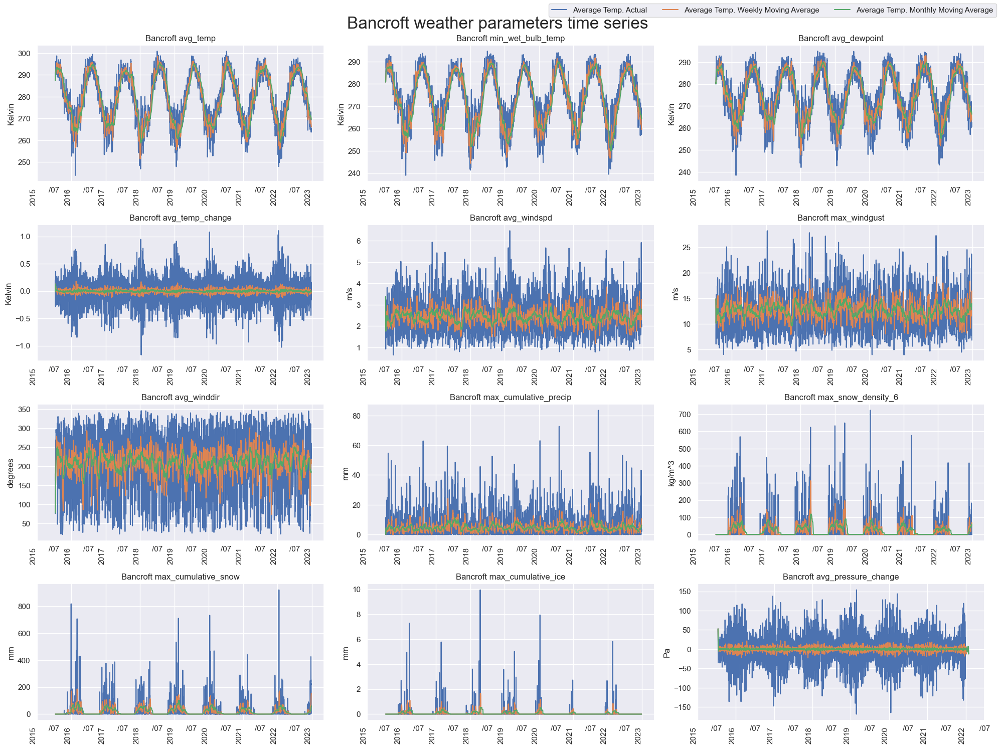

<Figure size 2000x1500 with 0 Axes>

In [6]:
rcParams['figure.figsize'] = 20, 15
sns.set(style="darkgrid")

parameters = [
        ('avg_temp', 'Kelvin'),
        ('min_wet_bulb_temp', 'Kelvin'),
        ('avg_dewpoint', 'Kelvin'),
        ('avg_temp_change', 'Kelvin'),
        ('avg_windspd', 'm/s'),
        ('max_windgust', 'm/s'),
        ('avg_winddir', 'degrees'),
        ('max_cumulative_precip', 'mm'),
        ('max_snow_density_6', 'kg/m^3'),
        ('max_cumulative_snow', 'mm'),
        ('max_cumulative_ice', 'mm'),
        ('avg_pressure_change', 'Pa')
    ]

def calculate_moving_averages(df, variables, time_periods): # has already been done in previous work at IBM (by Julian Erath) for the dataset # selected_variables = ['max_windgust', 'min_wet_bulb_temp', 'max_snow_density_6', 'max_cumulative_precip', 'max_cumulative_ice', 'max_cumulative_snow', 'avg_windspd','avg_pressure_change','avg_temp','avg_dewpoint','avg_winddir','avg_temp_change'] # selected_time_periods_week = [168] # selected_time_periods_month = [720]
    for variable in variables:
        for period in time_periods:
            ma_column_name = f'MA_{variable}_{period}_hours'
            df[ma_column_name] = df[variable].rolling(period, min_periods=1).mean()



def plot_weather_parameters(ax, data, parameter, unit):
    ax.plot(data.run_datetime, data[parameter], label=f'{parameter} Actual')
    ax.plot(data.run_datetime, data[f"MA_{parameter}_week"], label=f'{parameter} Weekly MA')
    ax.plot(data.run_datetime, data[f"MA_{parameter}_month"], label=f'{parameter} Monthly MA')
    ax.set_title(f'Bancroft {parameter}')
    ax.set_ylabel(unit)

    # Set the x-axis major locator to YearLocator and the formatter to the year
    ax.xaxis.set_major_locator(mdates.YearLocator())
    ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y'))

    # Manually add the mid-year tick for July 1st
    mid_years = [mdates.date2num(datetime.datetime(year, 7, 1)) for year in range(data.run_datetime.dt.year.min(), data.run_datetime.dt.year.max() + 1)]
    ax.set_xticks(list(ax.get_xticks()) + mid_years, minor=True)
    ax.xaxis.set_minor_formatter(mdates.DateFormatter('/%m'))

    # Rotate the labels for better visibility
    plt.setp(ax.xaxis.get_majorticklabels(), rotation=90, ha='right')

def create_subplots(data):
    fig, axes = plt.subplots(4, 3, figsize=[20,15])

    for i, (parameter, unit) in enumerate(parameters):
        plot_weather_parameters(axes[i // 3, i % 3], data, parameter, unit)

    plt.suptitle('Bancroft weather parameters time series', fontsize=24)
    plt.tight_layout()
    # Update the legend to handle multiple lines
    handles, labels = axes[0, 0].get_legend_handles_labels()
    new_labels = [label.replace("avg_temp", "Average Temp.").replace("MA", "Moving Average") for label in labels]
    fig.legend(handles, new_labels, loc='upper right', ncol=3)

    plt.show()
    plt.savefig('../output/Bancroft weather parameters time series.png')

create_subplots(df_full)


## Class Distribution of Blue Sky and Extreme Weather Events

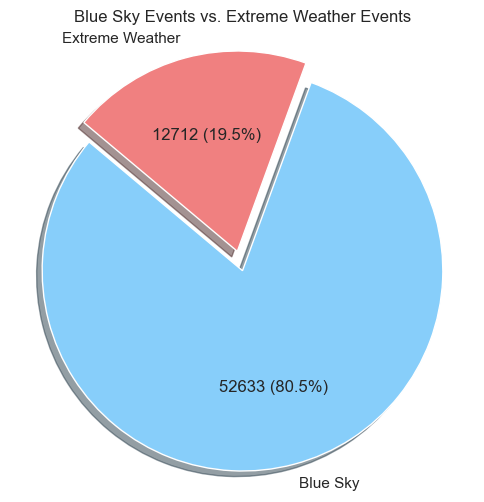

<Figure size 2000x1500 with 0 Axes>

In [7]:
# show data as pie chart
labels = ['Blue Sky', 'Extreme Weather']
sizes = df['label1'].value_counts()
colors = [ 'lightskyblue','lightcoral']
explode = (0.1, 0)  # explode first


# Plotting the pie chart
plt.figure(figsize=(6, 6))
plt.pie(sizes, explode=explode, labels=labels, colors=colors, autopct=lambda p: '{:.0f} ({:.1f}%)'.format(p * sum(sizes) / 100, p),
        shadow=True, startangle=140)
plt.axis('equal')
plt.title('Blue Sky Events vs. Extreme Weather Events')
plt.show()
plt.savefig('../output/Binary Classification Blue Sky vs Extreme Weather Events.png')


## Distribution of All Weather Events

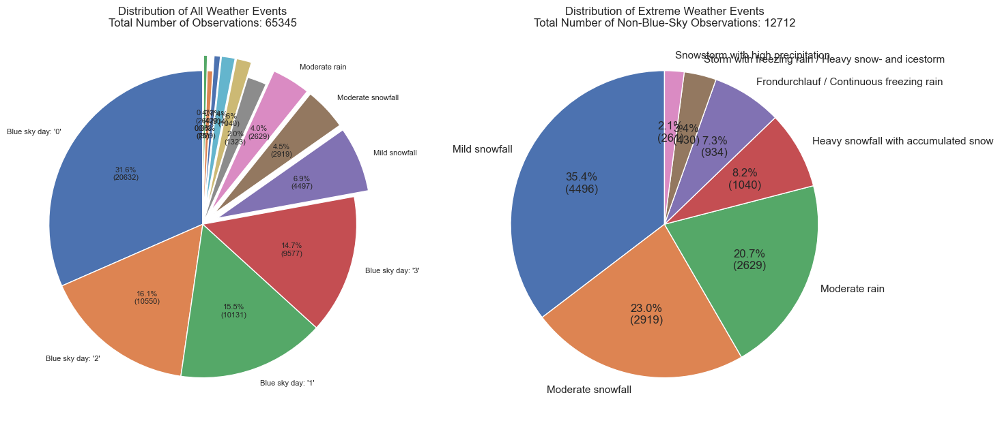

<Figure size 2000x1500 with 0 Axes>

In [8]:
# If 'Blue sky day' is present in 'wep', use 'label0'; otherwise, use 'wep'
df['display_label'] = df.apply(lambda row: f"{row['wep']}: '{row['label0']}'" if row['wep'] == 'Blue sky day' else row['wep'], axis=1)

# Count occurrences of weather events
weather_counts = df['display_label'].value_counts()

# Count occurrences of weather events excluding 'Blue sky day'
not_blue_sky_day_counts = df[df['wep'] != 'Blue sky day']['wep'].value_counts()

# Determine events to be exploded
explode_events = set(not_blue_sky_day_counts.index)

# Create explode list for the first chart
explode = [0.1 if event in explode_events else 0 for event in weather_counts.index]

# Total number of all samples
total_samples = len(df)

# Create the plot
plt.figure(figsize=(16, 8))

# Group categories and adjust labels
lower_half_threshold = weather_counts.quantile(0.5)
grouped_labels = [label if weather_counts[label] > lower_half_threshold else 'Other' for label in weather_counts.index]

# Pie chart for all weather events
plt.subplot(1, 2, 1)
patches, texts, autotexts = plt.pie(weather_counts, labels=grouped_labels, autopct=lambda p: f'{p:.1f}%\n({int(p/100*total_samples)})', startangle=90, explode=explode)
plt.title(f'Distribution of All Weather Events\nTotal Number of Observations: {total_samples}')

# Adjust text size and hide overlapping labels
for text, autotext in zip(texts, autotexts):
    if text.get_text() == 'Other':
        text.set_visible(False)
    text.set_fontsize(8)
    autotext.set_fontsize(8)

# Enlarged view for 'wep' != 'Blue sky day'
plt.subplot(1, 2, 2)
total_not_blue_samples = not_blue_sky_day_counts.sum()
plt.pie(not_blue_sky_day_counts, labels=not_blue_sky_day_counts.index, autopct=lambda p: f'{p:.1f}%\n({int(p/100*total_not_blue_samples)})', startangle=90)
plt.title(f'Distribution of Extreme Weather Events\nTotal Number of Non-Blue-Sky Observations: {total_not_blue_samples}')
plt.show()
plt.savefig('../output/Distribution of weather events pie chart.png')

## Association Plots and Correlation Analysis

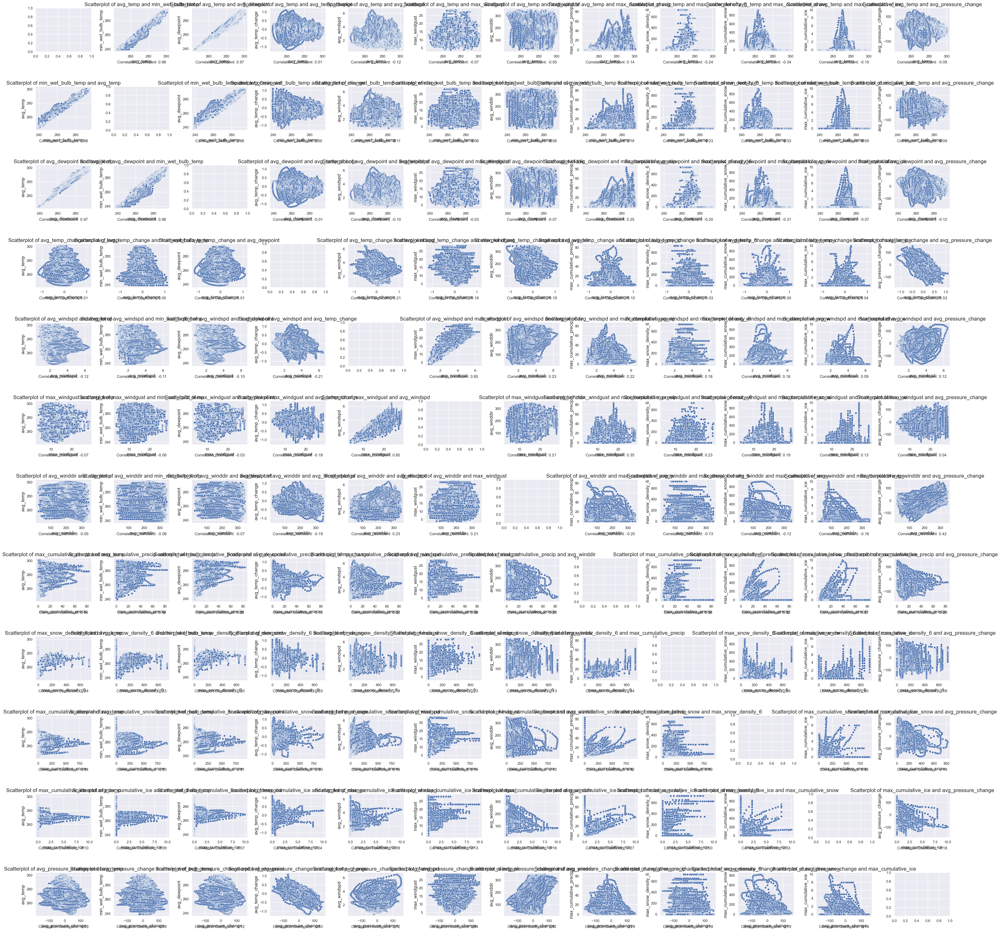

<Figure size 2000x1500 with 0 Axes>

In [9]:
# List of relevant weather parameters
relevant_parameters = ['avg_temp', 'min_wet_bulb_temp', 'avg_dewpoint', 'avg_temp_change', 'avg_windspd', 'max_windgust',
                       'avg_winddir', 'max_cumulative_precip', 'max_snow_density_6', 'max_cumulative_snow',
                       'max_cumulative_ice', 'avg_pressure_change']

# Display a scatter plot in a diagram with subplots for all parameter pairs
fig, axes = plt.subplots(len(relevant_parameters), len(relevant_parameters), figsize=(50, 50), gridspec_kw={'hspace': 0.8, 'wspace': 0.4})

# Function for calculating the correlation coefficient and displaying the scatterplot
def plot_scatter_and_correlation(ax, x, y, data):
    sns.scatterplot(x=x, y=y, data=data, ax=ax)
    correlation_coefficient = data[x].corr(data[y])
    ax.set_title(f'Scatterplot of {x} and {y}', fontsize=16)
    ax.set_xlabel(x, fontsize=14)
    ax.set_ylabel(y, fontsize=14)
    ax.text(0.5, -0.27, f'Correlation Coefficient: {correlation_coefficient:.2f}', transform=ax.transAxes, ha='center', fontsize=12)

# Loop over all parameters 
for i, feature_x in enumerate(relevant_parameters):
    for j, feature_y in enumerate(relevant_parameters):
        if i != j:  # Damit die Diagonale übersprungen wird (x gegen x)
            plot_scatter_and_correlation(axes[i, j], feature_x, feature_y, df)

plt.tight_layout()
plt.show()
plt.savefig('../output/Bancroft Association Plots.png')

## Distribution of Weather Features by Weather Event Profiles in Distograms

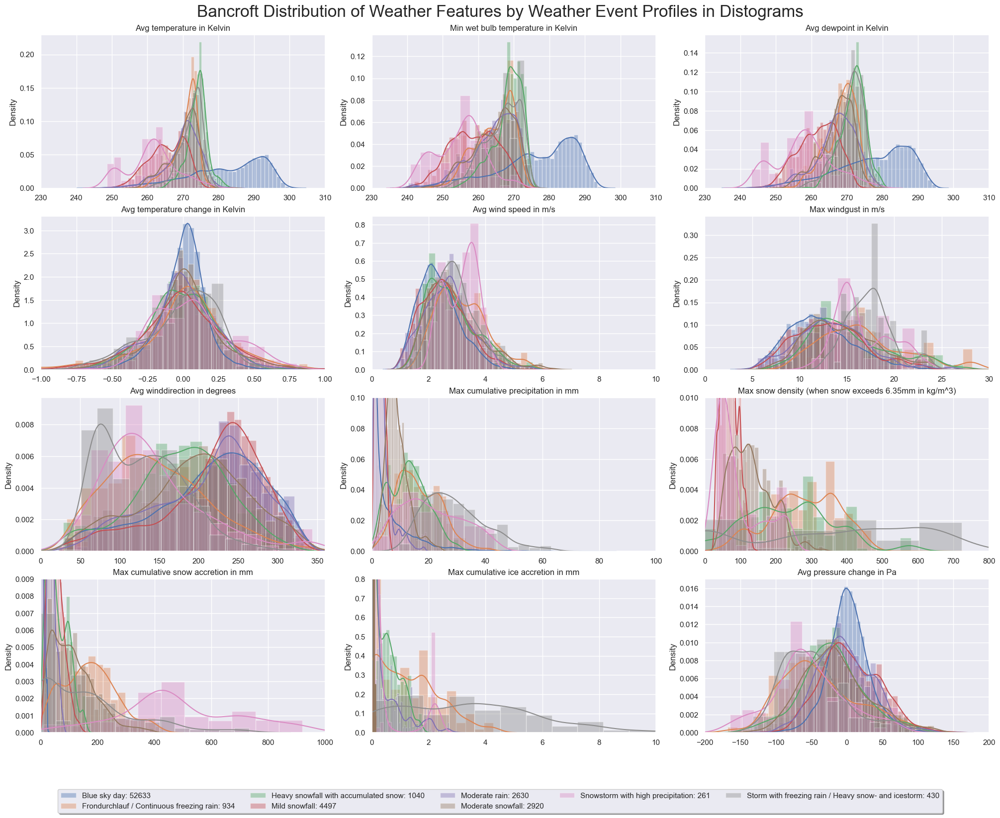

In [10]:

def plot_wep_features_distogram(df, label_col):

    f, axes = plt.subplots(4, 3, constrained_layout = True, figsize=[20,15])
    sns.set(style="darkgrid")
    for i in df[label_col].unique():
        df_cluster_distogram = df.loc[df[label_col] == i]
        axes = axes.ravel()
        num_label = df_cluster_distogram[label_col].value_counts()[i]
        for j, feature in enumerate(relevant_parameters):
            sns.distplot(df_cluster_distogram[feature], label=f'{i}: {num_label}', ax=axes[j])
            
    f.suptitle("Bancroft Distribution of Weather Features by Weather Event Profiles in Distograms", fontsize=24)
    
    axes[0].set(title="Avg temperature in Kelvin", xlim=(230, 310), xlabel="")
    h, l = axes[0].get_legend_handles_labels()
    axes[1].set(title="Min wet bulb temperature in Kelvin", xlim=(230, 310), xlabel="")
    axes[2].set(title="Avg dewpoint in Kelvin", xlim=(230, 310), xlabel="")
    axes[3].set(title="Avg temperature change in Kelvin", xlim=(-1, 1), xlabel="")
    axes[4].set(title="Avg wind speed in m/s", xlim=(0, 10), xlabel="")
    axes[5].set(title="Max windgust in m/s", xlim=(0, 30), xlabel="")
    axes[6].set(title="Avg winddirection in degrees", xlim=(0, 360), xlabel="")
    axes[7].set(title="Max cumulative precipitation in mm", xlim=(0, 100), ylim=(0, 0.1), xlabel="")
    axes[8].set(title="Max snow density (when snow exceeds 6.35mm in kg/m^3)", xlim=(0, 800), ylim=(0, 0.01), xlabel="")
    axes[9].set(title="Max cumulative snow accretion in mm", xlim=(0, 1000), ylim=(0, 0.009), xlabel="")
    axes[10].set(title="Max cumulative ice accretion in mm", xlim=(0, 10), ylim=(0, 0.8), xlabel="")
    axes[11].set(title="Avg pressure change in Pa",  xlim=(-200, 200), xlabel="")  
    f.legend(h, l, loc='upper center', bbox_to_anchor=(0.5, -0.05), fancybox=True, shadow=True, ncol=5)
    

data = df.dropna(subset=['wep'], how='any').sort_values('wep')
plot_wep_features_distogram(data, 'wep')
plt.savefig('../output/Bancroft_wep_parameter_distograms.png')

## Distribution of Weather Features by Weather Event Profiles in Boxplots

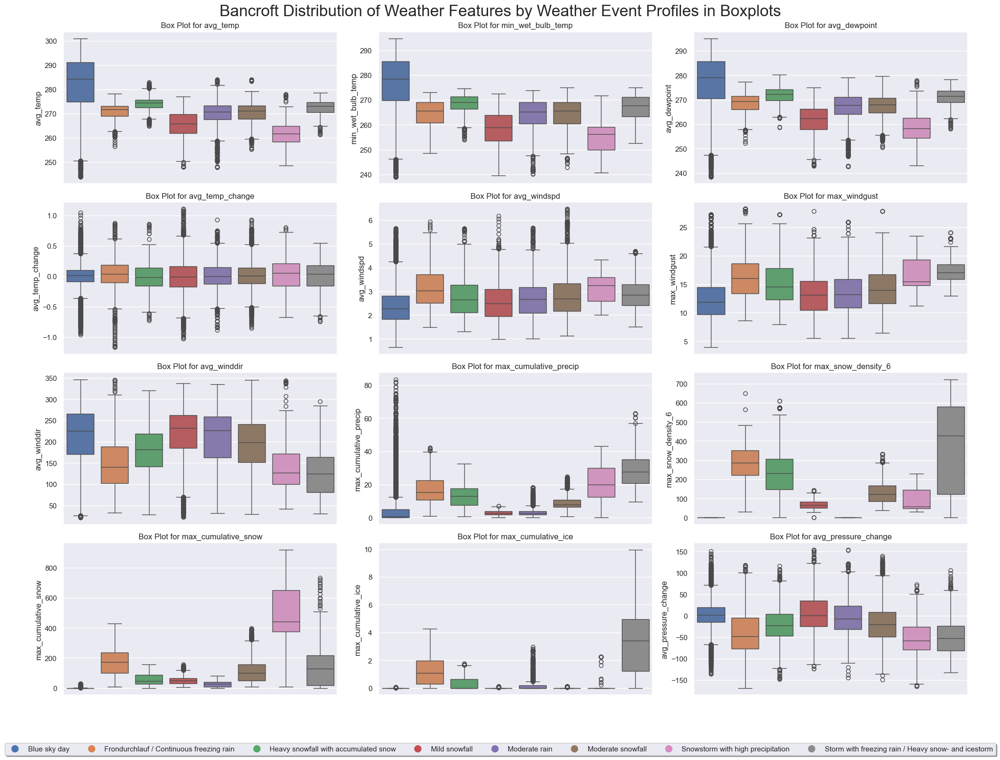

<Figure size 2000x1500 with 0 Axes>

In [11]:
def plot_wep_features_boxplot(df, label_col, relevant_parameters):
    unique_labels = df[label_col].unique()
    palette = sns.color_palette()
    label_colors = dict(zip(unique_labels, palette))

    f, axes = plt.subplots(4, 3, constrained_layout=True, figsize=[20, 15])
    sns.set(style="darkgrid")

    for j, feature in enumerate(relevant_parameters):
        ax = axes.flatten()[j]
        sns.boxplot(x=df[label_col], y=df[feature], ax=ax, palette=label_colors)

        ax.set_title(f'Box Plot for {feature}')
        ax.set_ylabel(feature)
        ax.set_xlabel('')
        ax.set_xticks([])
        ax.set_xticklabels([])
    f.suptitle("Bancroft Distribution of Weather Features by Weather Event Profiles in Boxplots", fontsize=24)
    handles = [plt.Line2D([0], [0], color=label_colors[label], marker='o', linestyle='', markersize=10) for label in unique_labels]
    f.legend(handles, unique_labels, loc='upper center', bbox_to_anchor=(0.5, -0.05), fancybox=True, shadow=True, ncol=len(unique_labels))
    plt.tight_layout()
    plt.show()

data = df.dropna(subset=['wep'], how='any').sort_values('wep')
plot_wep_features_boxplot(data, 'wep', relevant_parameters)
plt.savefig('../output/Bancroft_wep_parameter_boxplots.png')


## Analysis of Wind Speeds and Average Temperatures by Wind Direction

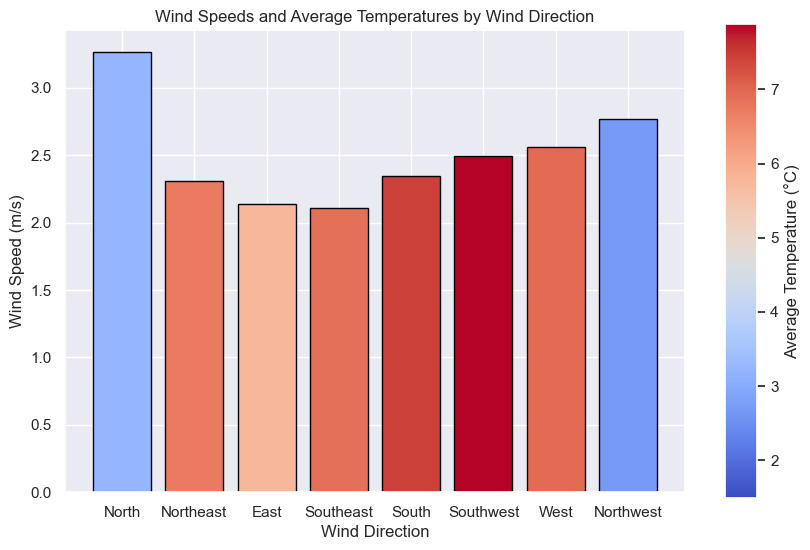

<Figure size 2000x1500 with 0 Axes>

In [12]:
def plot_wind_speed_and_avg_temp_by_direction(df_full, df, wind_direction_label, avg_temp_label, avg_windspd_label):
    # Calculate the average temperature for each wind direction
    avg_temp_by_direction = df_full.groupby(wind_direction_label)[avg_temp_label].mean().reset_index()

    # Order cardinal directions clockwise
    directions_ordered = ['North', 'Northeast', 'East', 'Southeast', 'South', 'Southwest', 'West', 'Northwest']
    avg_temp_by_direction[wind_direction_label] = pd.Categorical(avg_temp_by_direction[wind_direction_label], categories=directions_ordered, ordered=True)
    avg_temp_by_direction = avg_temp_by_direction.sort_values(wind_direction_label)

    # Color scale for temperature
    color_scale = plt.cm.get_cmap('coolwarm')

    # Create the bar chart
    fig, ax = plt.subplots(figsize=(8, 6))

    # Loop through the data and create bars with corresponding color
    for i, row in avg_temp_by_direction.iterrows():
        color = color_scale(row[avg_temp_label] / avg_temp_by_direction[avg_temp_label].max())
        wind_direction = row[wind_direction_label]
        average_wind_speed = df[df[wind_direction_label] == wind_direction][avg_windspd_label].mean()
        ax.bar(wind_direction, average_wind_speed, color=color, edgecolor='black')

    # Chart settings
    ax.set_xlabel('Wind Direction')
    ax.set_ylabel('Wind Speed (m/s)')
    ax.set_title('Wind Speeds and Average Temperatures by Wind Direction')

    # Create a separate Axes for the colorbar
    cax = fig.add_axes([0.95, 0.1, 0.04, 0.79])

    # Add color legend
    temperature_min = avg_temp_by_direction[avg_temp_label].min()
    temperature_max = avg_temp_by_direction[avg_temp_label].max()
    sm = plt.cm.ScalarMappable(cmap=color_scale, norm=plt.Normalize(vmin=temperature_min, vmax=temperature_max))
    sm.set_array([])  # empty data for the color legend
    cbar = plt.colorbar(sm, cax=cax, orientation='vertical')
    cbar.set_label('Average Temperature (°C)')

    # Show the chart
    plt.show()

# Beispielaufruf der Funktion
plot_wind_speed_and_avg_temp_by_direction(df_full, df, 'wind_direction_label', 'avg_temp_celsius', 'avg_windspd')
plt.savefig('../output/Bancroft Wind Speeds and Average Temperatures by Wind Direction.png')

## 3D plot of all weather observations using PCA

In [13]:
feature_columns = df.columns
columns_to_exclude = ['wep', 'run_datetime', 'avg_temp_celsius', 'avg_winddir', 'wind_direction_label', 'label0', 'label1', 'label2', 'year', 'month', 'display_label']
feature_columns = [col for col in feature_columns if col not in columns_to_exclude]

X = df[feature_columns].dropna()
X_standardized = StandardScaler().fit_transform(X)

# Apply PCA to reduce dimensionality to 3 components
pca = PCA(n_components=3)
X_pca = pca.fit_transform(X_standardized)

# Create a DataFrame with PCA results and 'wep' label
pca_df = pd.DataFrame(data=X_pca, columns=['PC1', 'PC2', 'PC3'])
pca_df['wep'] = df.loc[X.index, 'wep']

# Create an interactive 3D scatter plot using Plotly Express with smaller dots
fig = px.scatter_3d(pca_df, x='PC1', y='PC2', z='PC3', color='wep', symbol='wep', size_max=2, opacity=0.7,
                    labels={'wep': 'Weather'}, title='Interactive 3D PCA Plot of Weather Data')

# Update layout for better visualization
fig.update_layout(margin=dict(l=0, r=0, b=0, t=0))

# Update marker size for better visibility
fig.update_traces(marker=dict(size=2),
                  selector=dict(mode='markers'))

# Increase marker size in the legend
fig.update_layout(legend=dict(
    itemsizing='constant'
))

# Show the plot
fig.show()

<img src="../output/Interactive 3D PCA Plot of Weather Data.png" alt="Interactive 3D PCA Plot of Weather Data" />

## Linear Regression Analysis Temperature and Wind Modeling Results

X_train shape: (52276, 1)
X_test shape: (13069, 1)
y_train shape: (52276,)
y_test shape: (13069,)
Linear Regression Model:
Mean Squared Error: 127.78
Mean Absolute Error: 9.63

Gradient Boosting Model:
Mean Squared Error: 127.72
Mean Absolute Error: 9.63

Stochastic Gradient Descent Model:
Mean Squared Error: 127.78
Mean Absolute Error: 9.63

Support Vector Regression Model:
Mean Squared Error: 129.85
Mean Absolute Error: 9.57



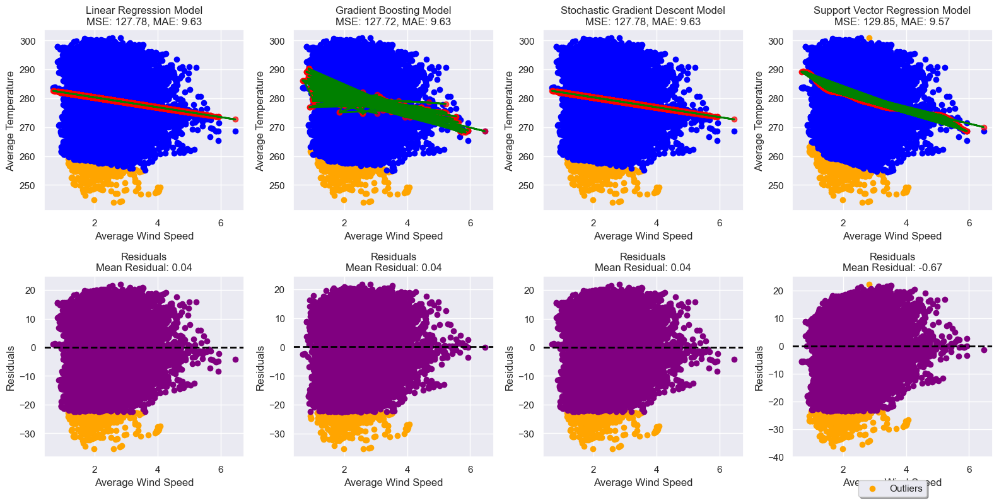

<Figure size 2000x1500 with 0 Axes>

In [14]:
# Create Linear Regression model
lr_model_1 = LinearRegression()

# Create Gradient Boosting Regressor
gb_model_1 = GradientBoostingRegressor(n_estimators=100, random_state=42)

# Create Stochastic Gradient Descent Regressor
sgd_model_1 = SGDRegressor(max_iter=1000, random_state=42)

# Create Support Vector Regressor
svr_model_1 = SVR()

# Select the features (independent variable)
X = df['avg_windspd'].values.reshape(-1, 1)

# Select the dependent variable
y = df['avg_temp']

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Print the shapes of the sets
print("X_train shape:", X_train.shape)
print("X_test shape:", X_test.shape)
print("y_train shape:", y_train.shape)
print("y_test shape:", y_test.shape)

# fit Linear Regression model
lr_model_fit_1 = lr_model_1.fit(X_train, y_train)

# fit Gradient Boosting Regressor
gb_model_fit_1 = gb_model_1.fit(X_train, y_train)

# fit Stochastic Gradient Descent Regressor
sgd_model_fit_1 = sgd_model_1.fit(X_train, y_train)

# fit Support Vector Regressor
svr_model_fit_1 = svr_model_1.fit(X_train, y_train)

# Function to evaluate and print model performance
def evaluate_model(model_name, model, X_test, y_test):
    y_pred = model.predict(X_test)
    mse = mean_squared_error(y_test, y_pred)
    mae = mean_absolute_error(y_test, y_pred)
    print(f'{model_name} Model:')
    print(f'Mean Squared Error: {mse:.2f}')
    print(f'Mean Absolute Error: {mae:.2f}')
    print()

# Evaluate Linear Regression model
evaluate_model('Linear Regression', lr_model_fit_1, X_test, y_test)

# Evaluate Gradient Boosting model
evaluate_model('Gradient Boosting', gb_model_fit_1, X_test, y_test)

# Evaluate Stochastic Gradient Descent model
evaluate_model('Stochastic Gradient Descent', sgd_model_fit_1, X_test, y_test)

# Evaluate Support Vector Regression model
evaluate_model('Support Vector Regression', svr_model_fit_1, X_test, y_test)

# Function to create subplots for model visualization and outlier analysis
def visualize_model(model_name, model, X_test, y_test, subplot_idx):
    y_pred = model.predict(X_test)

    # Calculate residuals
    residuals = y_test - y_pred

    # Calculate MSE and MAE
    mse = mean_squared_error(y_test, y_pred)
    mae = mean_absolute_error(y_test, y_pred)

    # Detect outliers using Z-scores
    z_scores = zscore(residuals)
    outliers = np.abs(z_scores) > 2  # Threshold for considering a point as an outlier

    # Create subplots for actual vs predicted values
    plt.subplot(2, 4, subplot_idx)
    plt.scatter(X_test[outliers], y_test[outliers], color='orange', label='Outliers')
    plt.scatter(X_test[~outliers], y_test[~outliers], color='blue', label='Actual')
    plt.scatter(X_test, y_pred, color='red', label='Predicted', alpha=0.7)
    plt.plot(X_test, y_pred, color='green', linewidth=2)
    plt.title(f'{model_name} Model\nMSE: {mse:.2f}, MAE: {mae:.2f}')
    plt.xlabel('Average Wind Speed')
    plt.ylabel('Average Temperature')

    # Create subplots for residual plots
    plt.subplot(2, 4, subplot_idx + 4)
    plt.scatter(X_test[outliers], residuals[outliers], color='orange', label='Outliers')
    plt.scatter(X_test[~outliers], residuals[~outliers], color='purple')
    plt.axhline(y=0, color='black', linestyle='--', linewidth=2)
    plt.title(f'Residuals\nMean Residual: {np.mean(residuals):.2f}')
    plt.xlabel('Average Wind Speed')
    plt.ylabel('Residuals')

# Create subplots
plt.figure(figsize=(16, 8))

# Visualize Linear Regression model with outliers
visualize_model('Linear Regression', lr_model_fit_1, X_test, y_test, 1)

# Visualize Gradient Boosting model with outliers
visualize_model('Gradient Boosting', gb_model_fit_1, X_test, y_test, 2)

# Visualize Stochastic Gradient Descent model with outliers
visualize_model('Stochastic Gradient Descent', sgd_model_fit_1, X_test, y_test, 3)

# Visualize Support Vector Regression model with outliers
visualize_model('Support Vector Regression', svr_model_fit_1, X_test, y_test, 4)

# Adjust layout for better visualization
plt.tight_layout()

# Create a single legend at the top of the entire plot
plt.legend(loc='upper center', bbox_to_anchor=(0.5, -0.1), fancybox=True, shadow=True, ncol=4)

plt.show()
plt.savefig('../output/Linear Regression Analysis Temperature and Wind Modeling Results.png')


## Linear Regression Analysis Multiple Predictors Correlation Matrix of Variables

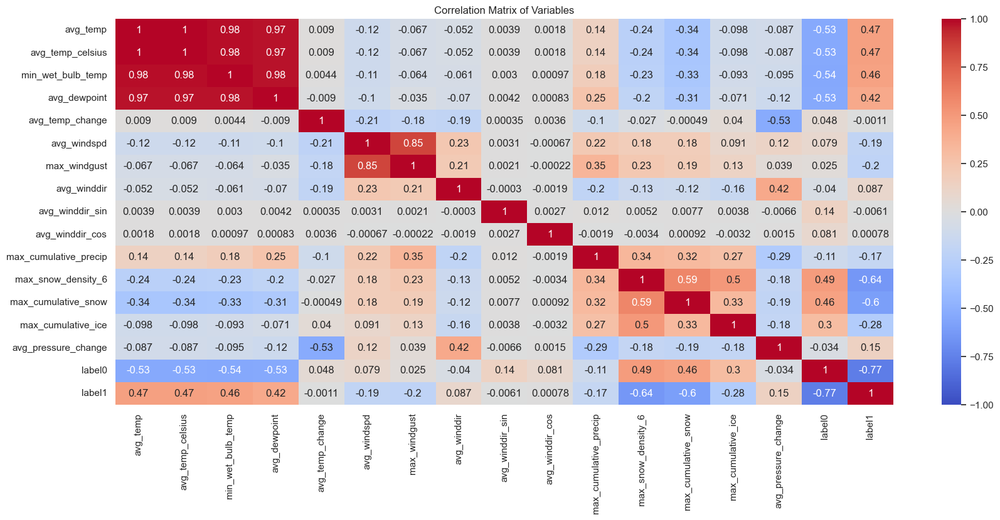

<Figure size 2000x1500 with 0 Axes>

In [15]:
#drop columns with datatype object
df_feature_selection = df.drop(columns=['run_datetime','wep','wind_direction_label','label2','display_label'])

# Calculate the correlation matrix
correlation_matrix = df_feature_selection.corr()

# Create a heatmap for the correlation matrix
plt.figure(figsize=(20, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', vmin=-1, vmax=1)
plt.title('Correlation Matrix of Variables')
plt.show()
plt.savefig('../output/Linear Regression Analysis Multiple Predictors Correlation Matrix of Variables.png')

## Linear Regression Analysis Multiple Predictors Seasonality and Trend

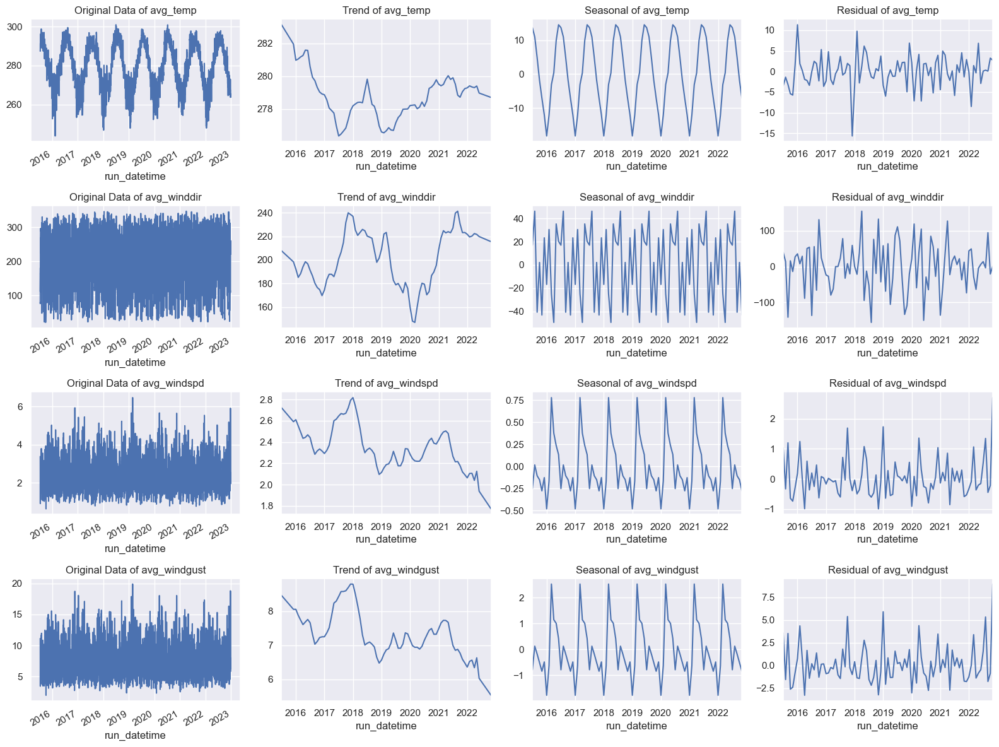

<Figure size 2000x1500 with 0 Axes>

In [16]:
# Extract relevant columns from the DataFrame
df_temp_wind = df_full[["run_datetime", "avg_temp", "avg_windspd", "avg_winddir", "avg_windgust"]]

# Set the 'run_datetime' column as the DataFrame index and convert it to datetime format
df_temp_wind.index = pd.to_datetime(df_temp_wind['run_datetime'])

# Drop the original 'run_datetime' column as it's now set as the index
df_temp_wind.drop(columns='run_datetime', inplace=True)

# Remove rows with duplicated indices, keeping only the first occurrence
df_temp_wind = df_temp_wind.loc[~df_temp_wind.index.duplicated(keep='first')]

def decompose_and_plot(data, variable_name, position):
    # Decompose the time series data
    decompose_data = seasonal_decompose(data.asfreq('M'), model="additive", extrapolate_trend='freq')
    
    # Plot the original data
    plt.subplot(4, 4, position)
    data.plot()
    plt.title(f'Original Data of {variable_name}')
    
    # Plot the trend component
    plt.subplot(4, 4, position + 1)
    decompose_data.trend.plot()
    plt.title(f'Trend of {variable_name}')
    
    # Plot the seasonal component
    plt.subplot(4, 4, position + 2)
    decompose_data.seasonal.plot()
    plt.title(f'Seasonal of {variable_name}')
    
    # Plot the residual component
    plt.subplot(4, 4, position + 3)
    decompose_data.resid.plot()
    plt.title(f'Residual of {variable_name}')


# Create a figure with a size of 16x12 inches
plt.figure(figsize=(16, 12))

# Decompose and plot for avg_temp
decompose_and_plot(df_temp_wind["avg_temp"], "avg_temp", 1)

# Decompose and plot for avg_winddir
decompose_and_plot(df_temp_wind["avg_winddir"], "avg_winddir", 5)

# Decompose and plot for avg_windspd
decompose_and_plot(df_temp_wind["avg_windspd"], "avg_windspd", 9)

# Decompose and plot for avg_windgust
decompose_and_plot(df_temp_wind["avg_windgust"], "avg_windgust", 13)

# Adjust layout to prevent overlap
plt.tight_layout()

# Display the plots
plt.show()
plt.savefig('../output/Linear Regression Analysis Multiple Predictors Seasonality and Trend.png')

## Linear Regression Analysis Multiple Predictors SARIMAX Forecast Results

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            9     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -2.33934D+00    |proj g|=  2.27869D+01


 This problem is unconstrained.



At iterate    5    f= -2.35851D+00    |proj g|=  5.07954D+00

At iterate   10    f= -2.42141D+00    |proj g|=  1.55207D-01

At iterate   15    f= -2.42143D+00    |proj g|=  2.57911D-01

At iterate   20    f= -2.42185D+00    |proj g|=  8.96676D-01

At iterate   25    f= -2.42207D+00    |proj g|=  1.29386D-02

At iterate   30    f= -2.42237D+00    |proj g|=  1.15344D+00

At iterate   35    f= -2.42282D+00    |proj g|=  1.45321D-01

At iterate   40    f= -2.42283D+00    |proj g|=  2.66534D-01

At iterate   45    f= -2.42324D+00    |proj g|=  7.45443D-01

At iterate   50    f= -2.42344D+00    |proj g|=  9.01914D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

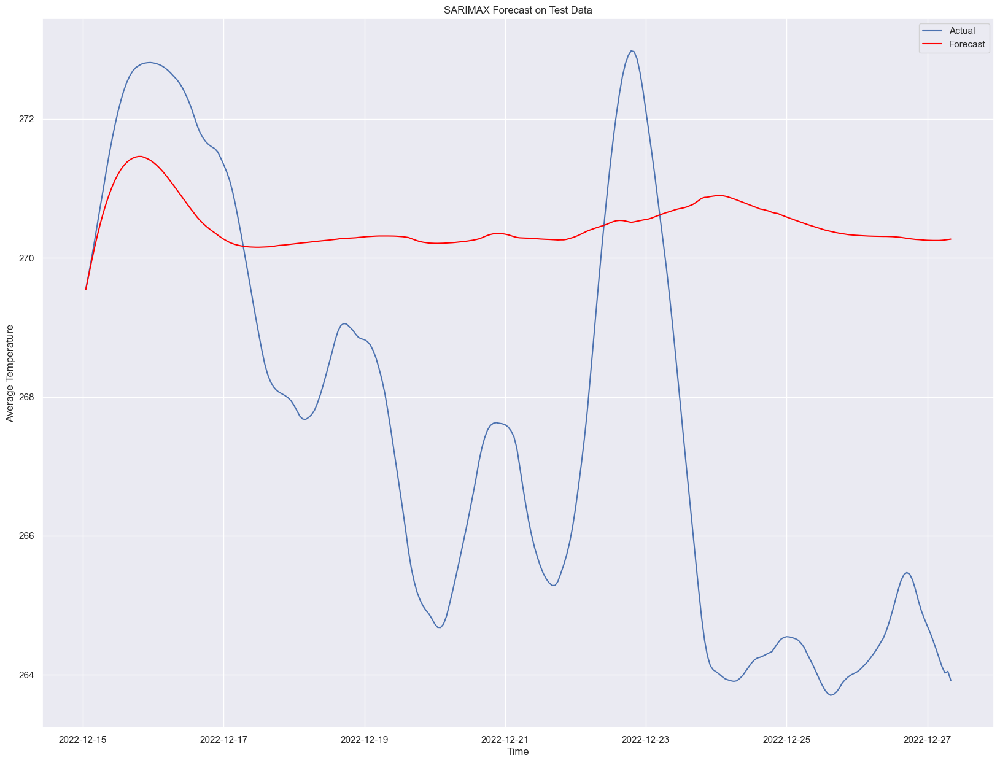

<Figure size 2000x1500 with 0 Axes>

In [17]:
#manually define train and test data
train_df = df_temp_wind[df_temp_wind.index <= datetime.datetime(2022,12,15)]
test_df = df_temp_wind[df_temp_wind.index > datetime.datetime(2022,12,15)]

# Define exogenous variables
exog_vars = ['avg_windspd', 'avg_winddir']

# Set the frequency to hourly
train_df= train_df.asfreq('1H') 
#Delete missing values
train_df = train_df.dropna(subset=exog_vars)

# Set Hyper-Parameters
p, d, q = 3, 1, 3
P, D, Q = 0, 0, 0
s = 24

# Fit SARIMAX
sarimax_model = SARIMAX(train_df['avg_temp'],
                order=(p, d, q),
                seasonal_order=(P, D, Q, s),
                exog=train_df[exog_vars])

sarimax_model_fit = sarimax_model.fit()


# Get the forecast for the test period
forecast_steps = len(test_df)
forecast_index = test_df.index  # Use the time index of the test dataframe

forecast = sarimax_model_fit.get_forecast(steps=forecast_steps, exog=test_df[exog_vars])

# Plot the actual values
plt.plot(test_df['avg_temp'], label='Actual')

# Plot the forecasted values
plt.plot(forecast_index, forecast.predicted_mean, label='Forecast', color='red')

# Plot confidence intervals
#plt.fill_between(forecast_index, forecast.conf_int()['lower avg_temp'], forecast.conf_int()['upper avg_temp'], color='pink', alpha=0.3)

# Set labels and title
plt.xlabel('Time')
plt.ylabel('Average Temperature')
plt.title('SARIMAX Forecast on Test Data')
plt.legend()

# Show the plot
plt.show()
plt.savefig('../output/Linear Regression Analysis Multiple Predictors SARIMAX Forecast Results.png')

## Linear Regression Analysis Prediction Forecast Results

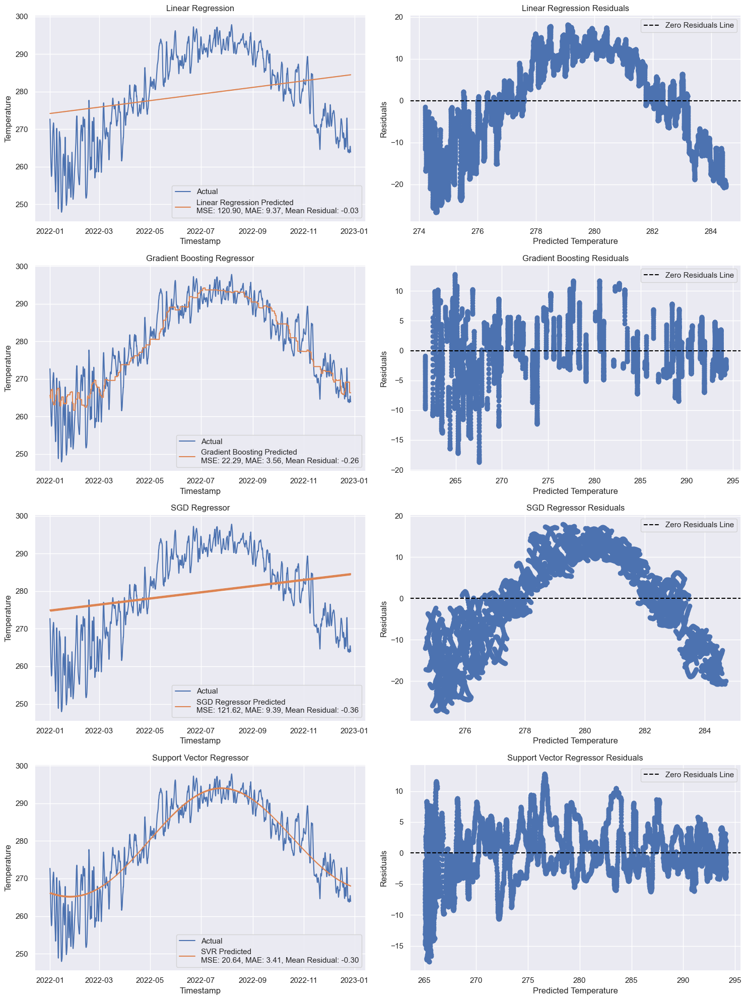

<Figure size 2000x1500 with 0 Axes>

In [18]:
# Cloning DataFrame to manipulate it for the forecast prediction
forecast_data = pd.DataFrame(df)

# Convert timestamp to datetime format
forecast_data['timestamp'] = pd.to_datetime(forecast_data['run_datetime'])

# Extract day of the year and hour of the day
forecast_data['day_of_year'] = forecast_data['timestamp'].dt.dayofyear
forecast_data['hour'] = forecast_data['timestamp'].dt.hour

# Assuming 'avg_temp' is the target variable
X = forecast_data[['day_of_year', 'hour']]
y = forecast_data['avg_temp']

# Create models
linear_regression_model = make_pipeline(LinearRegression())
gradient_boosting_model = GradientBoostingRegressor()
sgd_regressor_model = make_pipeline(StandardScaler(), SGDRegressor())
svr_model = SVR()

# Split the data into training and testing sets
train_mask = (forecast_data['timestamp'].dt.year >= 2015) & (forecast_data['timestamp'].dt.year <= 2021)
test_mask = (forecast_data['timestamp'].dt.year == 2022)

X_train, X_test = X[train_mask], X[test_mask]
y_train, y_test = y[train_mask], y[test_mask]

# Train models
linear_regression_model_fit = linear_regression_model.fit(X_train, y_train)
gradient_boosting_model_fit = gradient_boosting_model.fit(X_train, y_train)
sgd_regressor_model_fit = sgd_regressor_model.fit(X_train, y_train)
svr_model_fit = svr_model.fit(X_train, y_train)

# Make predictions on the test set
y_pred_linear_regression = linear_regression_model_fit.predict(X_test)
y_pred_gradient_boosting = gradient_boosting_model_fit.predict(X_test)
y_pred_sgd_regressor = sgd_regressor_model_fit.predict(X_test)
y_pred_svr = svr_model_fit.predict(X_test)

# Calculate residuals
residuals_linear_regression = y_test - y_pred_linear_regression
residuals_gradient_boosting = y_test - y_pred_gradient_boosting
residuals_sgd_regressor = y_test - y_pred_sgd_regressor
residuals_svr = y_test - y_pred_svr

# Calculate MSE, MAE, and Mean Residual Error for each model
mse_linear_regression = mean_squared_error(y_test, y_pred_linear_regression)
mae_linear_regression = mean_absolute_error(y_test, y_pred_linear_regression)
mean_residual_error_linear_regression = np.mean(residuals_linear_regression)

mse_gradient_boosting = mean_squared_error(y_test, y_pred_gradient_boosting)
mae_gradient_boosting = mean_absolute_error(y_test, y_pred_gradient_boosting)
mean_residual_error_gradient_boosting = np.mean(residuals_gradient_boosting)

mse_sgd_regressor = mean_squared_error(y_test, y_pred_sgd_regressor)
mae_sgd_regressor = mean_absolute_error(y_test, y_pred_sgd_regressor)
mean_residual_error_sgd_regressor = np.mean(residuals_sgd_regressor)

mse_svr = mean_squared_error(y_test, y_pred_svr)
mae_svr = mean_absolute_error(y_test, y_pred_svr)
mean_residual_error_svr = np.mean(residuals_svr)

# Visualize the predictions, residuals, and tolerance zone
plt.figure(figsize=(15, 20))

# Linear Regression subplot
plt.subplot(4, 2, 1)
plt.plot(forecast_data[test_mask]['timestamp'], y_test, label='Actual')
plt.plot(forecast_data[test_mask]['timestamp'], y_pred_linear_regression, label=f'Linear Regression Predicted\nMSE: {mse_linear_regression:.2f}, MAE: {mae_linear_regression:.2f}, Mean Residual: {mean_residual_error_linear_regression:.2f}')
plt.xlabel('Timestamp')
plt.ylabel('Temperature')
plt.title('Linear Regression')
plt.legend()

# Linear Regression Residuals subplot
plt.subplot(4, 2, 2)
plt.scatter(y_pred_linear_regression, residuals_linear_regression)
plt.axhline(y=0, color='black', linestyle='--', label='Zero Residuals Line')
plt.xlabel('Predicted Temperature')
plt.ylabel('Residuals')
plt.title('Linear Regression Residuals')
plt.legend()

# Gradient Boosting Regressor subplot
plt.subplot(4, 2, 3)
plt.plot(forecast_data[test_mask]['timestamp'], y_test, label='Actual')
plt.plot(forecast_data[test_mask]['timestamp'], y_pred_gradient_boosting, label=f'Gradient Boosting Predicted\nMSE: {mse_gradient_boosting:.2f}, MAE: {mae_gradient_boosting:.2f}, Mean Residual: {mean_residual_error_gradient_boosting:.2f}')
plt.xlabel('Timestamp')
plt.ylabel('Temperature')
plt.title('Gradient Boosting Regressor')
plt.legend()

# Gradient Boosting Residuals subplot
plt.subplot(4, 2, 4)
plt.scatter(y_pred_gradient_boosting, residuals_gradient_boosting)
plt.axhline(y=0, color='black', linestyle='--', label='Zero Residuals Line')
plt.xlabel('Predicted Temperature')
plt.ylabel('Residuals')
plt.title('Gradient Boosting Residuals')
plt.legend()

# SGD Regressor subplot
plt.subplot(4, 2, 5)
plt.plot(forecast_data[test_mask]['timestamp'], y_test, label='Actual')
plt.plot(forecast_data[test_mask]['timestamp'], y_pred_sgd_regressor, label=f'SGD Regressor Predicted\nMSE: {mse_sgd_regressor:.2f}, MAE: {mae_sgd_regressor:.2f}, Mean Residual: {mean_residual_error_sgd_regressor:.2f}')
plt.xlabel('Timestamp')
plt.ylabel('Temperature')
plt.title('SGD Regressor')
plt.legend()

# SGD Regressor Residuals subplot
plt.subplot(4, 2, 6)
plt.scatter(y_pred_sgd_regressor, residuals_sgd_regressor)
plt.axhline(y=0, color='black', linestyle='--', label='Zero Residuals Line')
plt.xlabel('Predicted Temperature')
plt.ylabel('Residuals')
plt.title('SGD Regressor Residuals')
plt.legend()

# SVR subplot
plt.subplot(4, 2, 7)
plt.plot(forecast_data[test_mask]['timestamp'], y_test, label='Actual')
plt.plot(forecast_data[test_mask]['timestamp'], y_pred_svr, label=f'SVR Predicted\nMSE: {mse_svr:.2f}, MAE: {mae_svr:.2f}, Mean Residual: {mean_residual_error_svr:.2f}')
plt.xlabel('Timestamp')
plt.ylabel('Temperature')
plt.title('Support Vector Regressor')
plt.legend()

# SVR Residuals subplot
plt.subplot(4, 2, 8)
plt.scatter(y_pred_svr, residuals_svr)
plt.axhline(y=0, color='black', linestyle='--', label='Zero Residuals Line')
plt.xlabel('Predicted Temperature')
plt.ylabel('Residuals')
plt.title('Support Vector Regressor Residuals')
plt.legend()

plt.tight_layout()
plt.show()
plt.savefig('../output/Linear Regression Analysis Prediction Forecast Results.png')


<img src="../references/images/temporal_regression_plots.png" alt="Temporal Regression Plots" />

## Logistic Regression Analysis Predicting WEP by Temperature Results

Optimization terminated successfully.
         Current function value: 0.375341
         Iterations 7
AIC: 39246.63967824996
Label 0: Extreme Weather Event 
 Label 1: Blue Sky Day


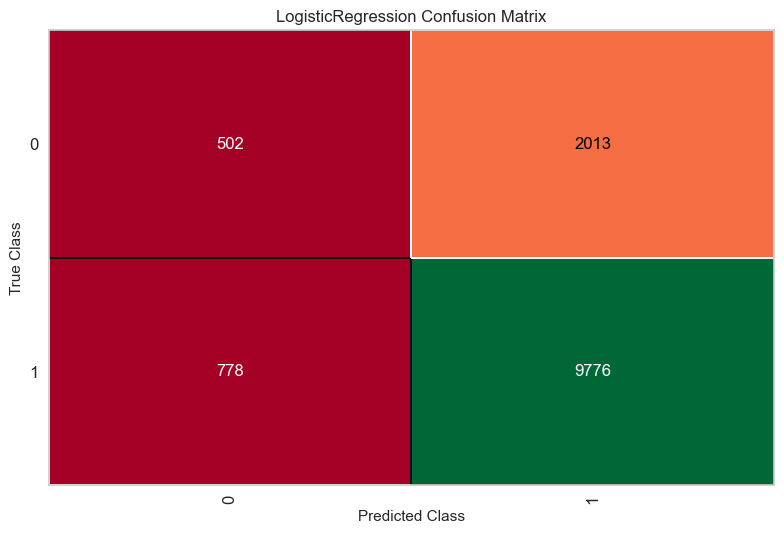


Classification Report:
              precision    recall  f1-score   support

           0       0.39      0.20      0.26      2515
           1       0.83      0.93      0.88     10554

    accuracy                           0.79     13069
   macro avg       0.61      0.56      0.57     13069
weighted avg       0.75      0.79      0.76     13069



<Figure size 800x550 with 0 Axes>

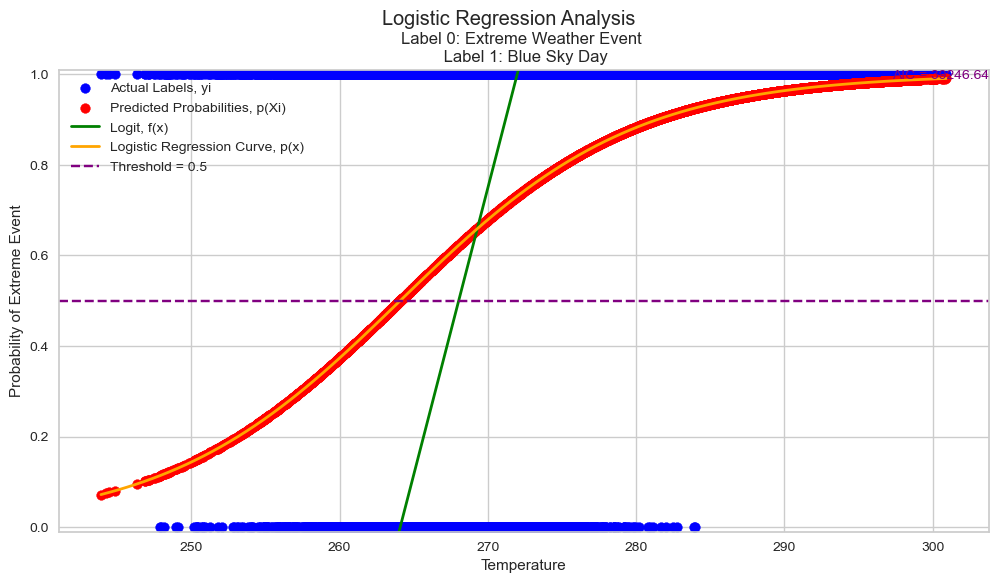

<Figure size 800x550 with 0 Axes>

In [19]:
# Create Logistic Regressuin Model
logreg_model = LogisticRegression()

# Select the features (independent variable)
X = df[['avg_temp']]

# Select the dependent variable
y = df['label1']

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Standardize the features (reshape to 2D array)
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train.values.reshape(-1, 1))
X_test_scaled = scaler.transform(X_test.values.reshape(-1, 1))

# Fit Logistic Regression model
logreg_model.fit(X_train_scaled, y_train)

# Add a constant to the features for statsmodels
X_train_sm = sm.add_constant(X_train_scaled)

# Create a logistic regression model using statsmodels
logit_model_sm = sm.Logit(y_train, X_train_sm)

# Fit the logit sm  model
logit_model = logit_model_sm.fit()

from yellowbrick.classifier import ConfusionMatrix, ClassificationReport

# Print AIC
aic_value = logit_model.aic
print("AIC:", aic_value)
print("Label 0: Extreme Weather Event \n Label 1: Blue Sky Day")

# Make predictions on the test set using the result object
X_test_sm = sm.add_constant(X_test_scaled)
y_prob = logit_model.predict(X_test_sm)  # Probabilities
y_pred = (y_prob > 0.5).astype(int)  # Convert probabilities to binary predictions

# Confusion Matrix as Diagram with custom colors
cm_viz = ConfusionMatrix(logreg_model, classes=[0, 1], cmap='RdYlGn')
cm_viz.score(X_test_scaled, y_test)
cm_viz.show()
plt.show()
plt.savefig('../output/Logistic Regression Predicting WEP by Temperature Confussion Matrix.png')

print("\nClassification Report:")
print(classification_report(y_test, y_pred))

# Visualize results
plt.figure(figsize=(12, 6))

# Plot the data points on the logistic regression curve based on probabilities
y_vals_prob = logit_model.predict(sm.add_constant(scaler.transform(X_test.values.reshape(-1, 1))))
plt.scatter(X_test, y_test, color='blue', label='Actual Labels, yi')
plt.scatter(X_test, y_vals_prob, color='red', marker='o', label='Predicted Probabilities, p(Xi)')

# Plot the linear part of the logistic regression curve
x_vals = np.linspace(X_test.min(), X_test.max(), 100)
linear_combination = logit_model.params[0] + logit_model.params[1] * scaler.transform(x_vals.reshape(-1, 1))

# Logistic function (sigmoid) to convert linear combination to probability
logistic_function = 1 / (1 + np.exp(-linear_combination))

plt.plot(x_vals, linear_combination, color='green', linewidth=2, label='Logit, f(x)')
plt.plot(x_vals, logistic_function, color='orange', linewidth=2, label='Logistic Regression Curve, p(x)')

# Plot the threshold line at y=0.5
plt.axhline(y=0.5, color='purple', linestyle='--', label='Threshold = 0.5')

# Set y-axis limits
plt.ylim(-0.01, 1.01)

# Display AIC value
plt.text(plt.xlim()[1], plt.ylim()[1], f'AIC = {aic_value:.2f}', ha='right', va='top', fontsize=10, color='purple')

plt.xlabel('Temperature')
plt.ylabel('Probability of Extreme Event')
plt.suptitle('Logistic Regression Analysis')
plt.title('Label 0: Extreme Weather Event \n Label 1: Blue Sky Day')
plt.legend()
plt.show()
plt.savefig('../output/Logistic Regression Analysis Predicting WEP by Temperature Results.png')

## Methodology and Results Binary Classification

In [20]:
#copy df
df_class = df

# Calculate the mean value of the column
mean_value = df_class["avg_pressure_change"].mean()

#set "avg_temp_change" to 0 in the first row, as there is no temp change
df_class.at[0, 'avg_temp_change'] = 0

#drop columns, which are not numeric and not needed
df_class = df_class.drop(columns = ['wep','wind_direction_label', 'run_datetime','label2','avg_pressure_change','label0', 'display_label'])

## Define predictor variables
X = df_class.drop(columns = ['label1', 'max_snow_density_6'])

## Define response variable
y = df_class['label1']

# Split the dataset into training and testing data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Initialize the classifiers
classifiers = {
    'ExtraTrees': ExtraTreesClassifier(),
    'XGBoost': XGBClassifier(),
    'LGBM': LGBMClassifier(verbose=-1),
    'RandomForest': RandomForestClassifier()
}

# Train the classifiers and collect accuracies
accuracies = {}

for idx, (name, clf) in enumerate(classifiers.items()):
    clf.fit(X_train, y_train)
    y_pred = clf.predict(X_test)
    accuracy = accuracy_score(y_test, y_pred)
    accuracies[name] = accuracy
    print(f'{name} Accuracy: {accuracy}')

ExtraTrees Accuracy: 0.993496059377152
XGBoost Accuracy: 0.9946438136047134
LGBM Accuracy: 0.9935725763256561
RandomForest Accuracy: 0.9933430254801439


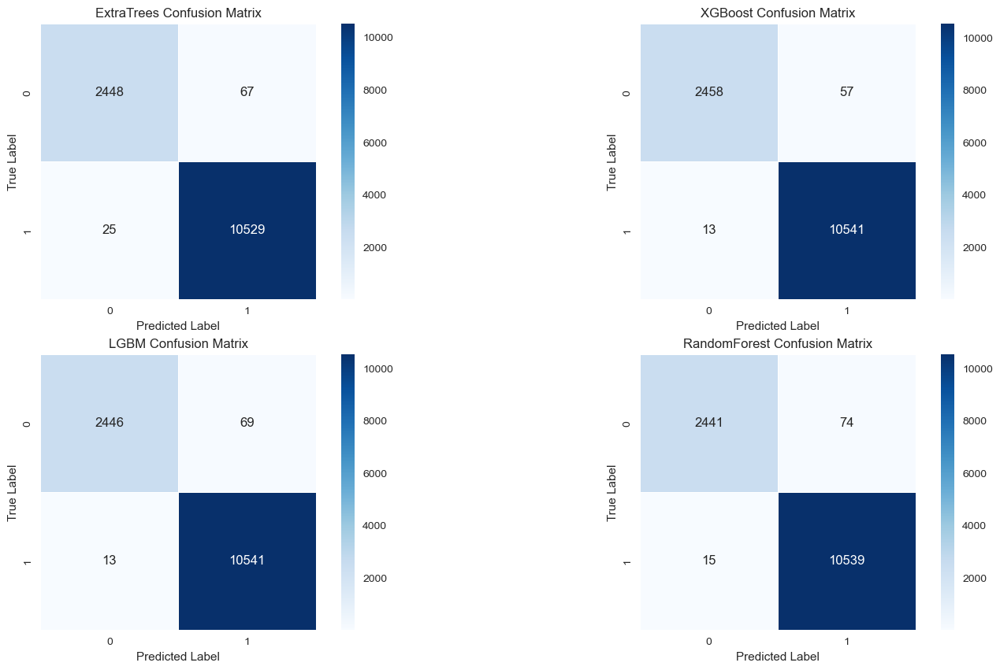

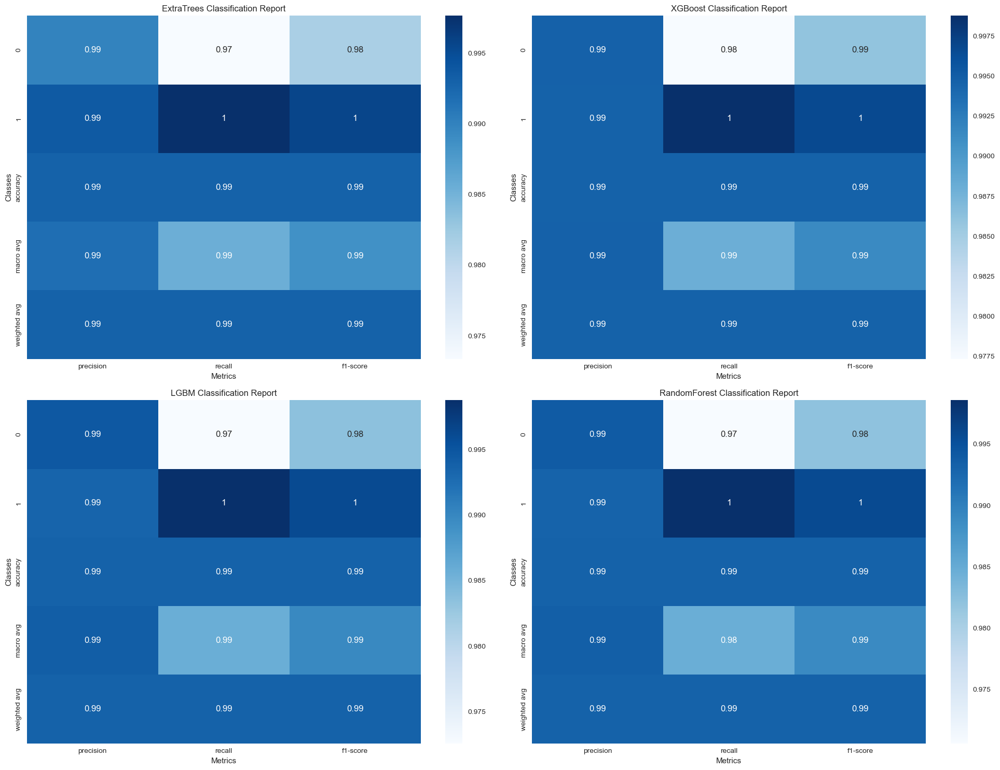

<Figure size 800x550 with 0 Axes>

In [21]:
# Set up subplots for confusion matrices
fig, axes = plt.subplots(2, 2, figsize=(18, 10))

# Flatten the axes array for easy iteration
axes_confusion = axes.flatten()

# Create an empty list to store classification reports
classification_reports = []

# Iterate over classifiers and plot confusion matrices
for ax, (name, model) in zip(axes_confusion, classifiers.items()):
    # Create a pipeline with StandardScaler and the current model
    pipe = make_pipeline(StandardScaler(), model)
    pipe.fit(X_train, y_train)
    y_pred = pipe.predict(X_test)

    # Calculate confusion matrix
    cm = confusion_matrix(y_test, y_pred)

    # Plot heatmap for confusion matrix
    sns.heatmap(cm, annot=True, fmt=".0f", linewidths=.5, square=True, cmap='Blues', ax=ax)

    # Set labels and title
    ax.set_xlabel('Predicted Label')
    ax.set_ylabel('True Label')
    ax.set_title(f'{name} Confusion Matrix')

    # Calculate and store classification report
    report = classification_report(y_test, y_pred, output_dict=True)
    classification_reports.append((name, report))

# Set up subplots for classification reports
fig, axes_reports = plt.subplots(2, 2, figsize=(20, 15))

# Flatten the axes array for easy iteration
axes_reports = axes_reports.flatten()

# Iterate over classification reports and plot heatmaps
for ax, (name, report) in zip(axes_reports, classification_reports):
    # Plot heatmap for classification report
    sns.heatmap(pd.DataFrame(report).iloc[:-1, :].T, annot=True, cmap='Blues', ax=ax)

    # Set labels and title
    ax.set_xlabel('Metrics')
    ax.set_ylabel('Classes')
    ax.set_title(f'{name} Classification Report')

# Adjust layout for better spacing
plt.tight_layout()

# Show the plots
plt.show()
plt.savefig('../output/Binary Classification Confusion Matrix and Classification Report.png')


## Methodology and Results Multiclass Classification

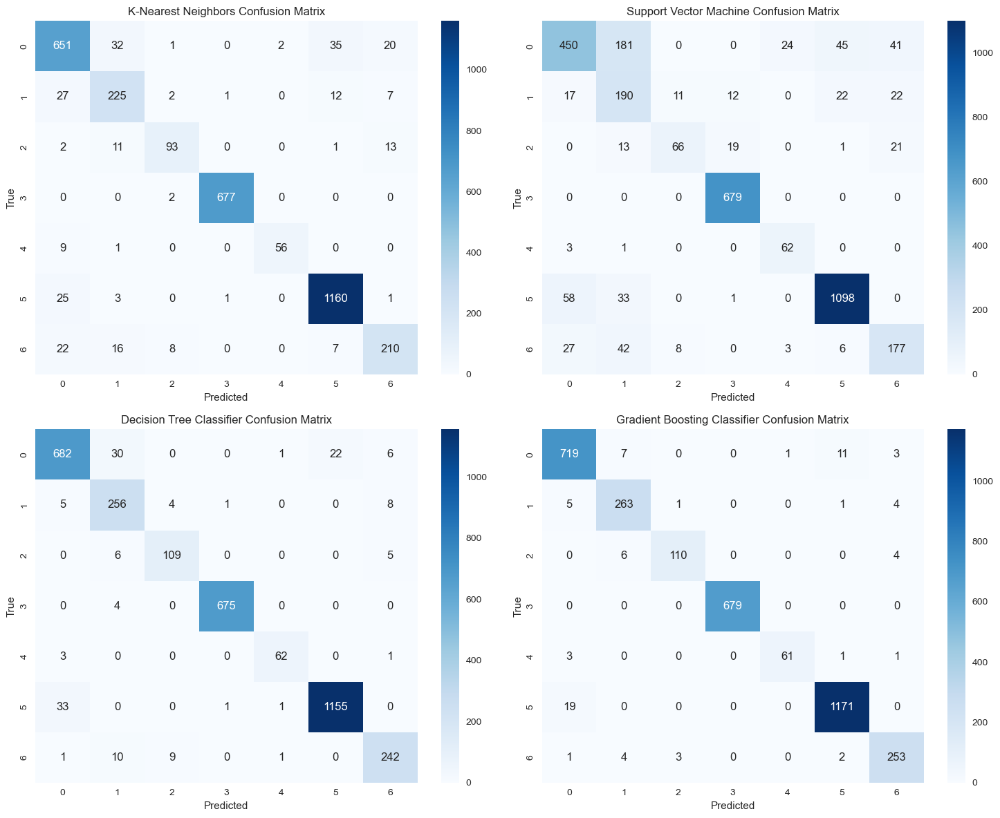

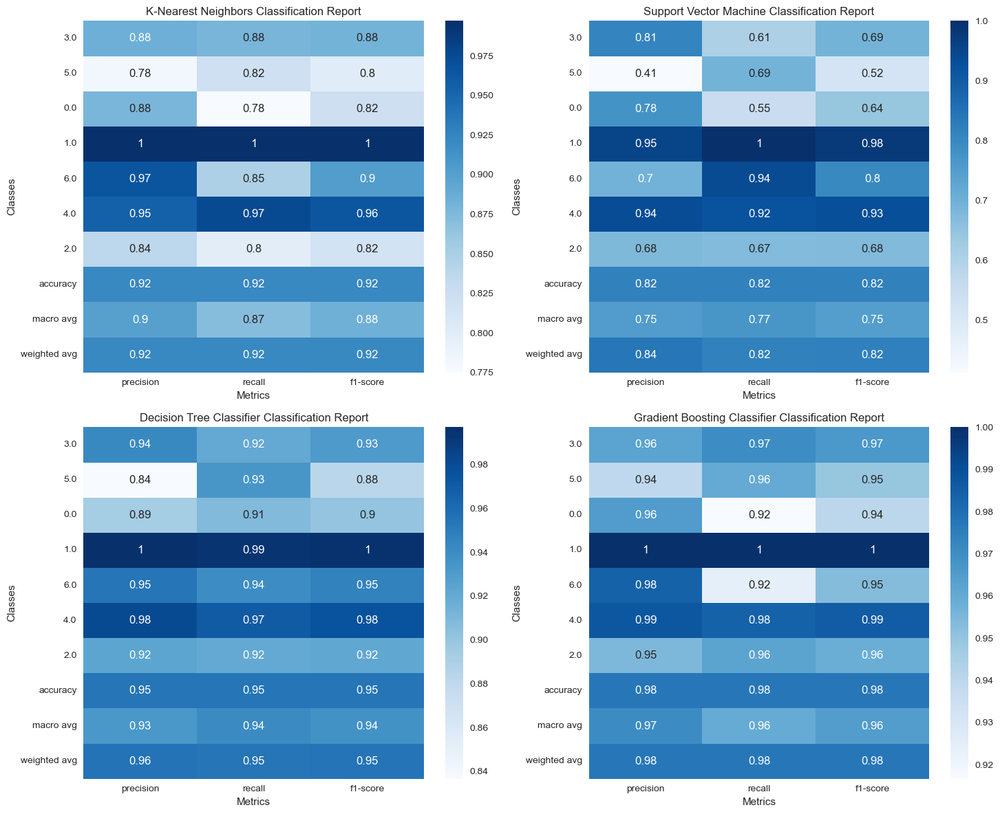

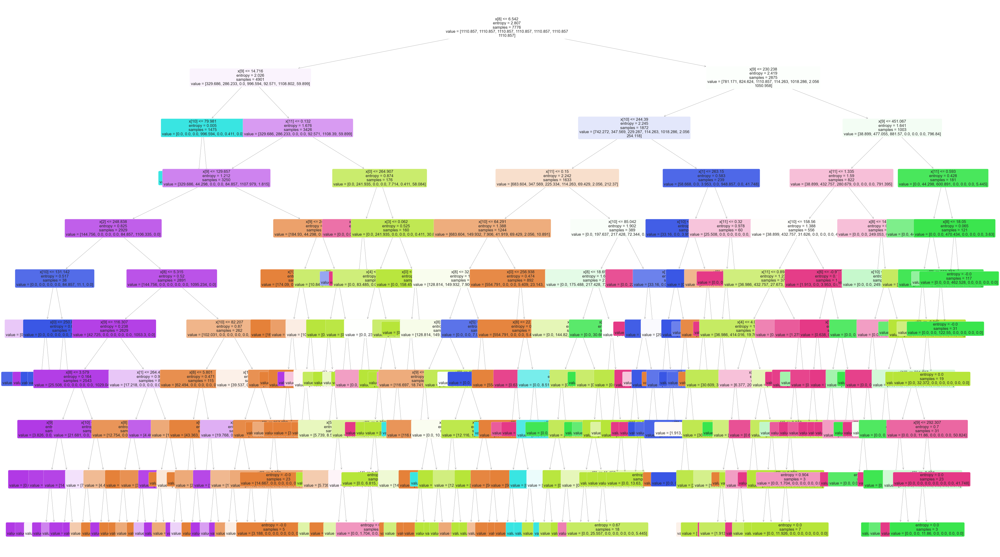

In [22]:
# Creating new dataframe that only includes extreme weather observations
df_extreme_weather = pd.DataFrame(df)
df_extreme_weather = df_extreme_weather[df_extreme_weather['label1'] != 1]

# Dropping NaN
df_extreme_weather = df_extreme_weather.dropna()

knn_model = KNeighborsClassifier(
    n_neighbors=5, 
    weights='uniform', 
    algorithm='auto', 
    leaf_size=30, 
    p=2, 
    metric='minkowski', 
    metric_params=None, 
    n_jobs=None)
svm_model = svm.SVC(
    C=1.0, 
    kernel='rbf', 
    degree=3, 
    gamma='scale', 
    coef0=0.0, 
    tol=0.001, 
    cache_size=800, 
    class_weight='balanced', 
    random_state=42)
dtc_model = DecisionTreeClassifier(
    criterion="entropy", 
    class_weight="balanced", 
    max_depth=10, 
    min_samples_leaf=3, 
    max_features=None, 
    random_state=42)
gbc_model = GradientBoostingClassifier(
    loss='log_loss', 
    learning_rate=0.1, 
    n_estimators=100, 
    subsample=1.0, 
    criterion='friedman_mse', 
    min_samples_split=2, 
    min_samples_leaf=3, 
    min_weight_fraction_leaf=0.0, 
    max_depth=10, 
    )

# Defining the dependent and independent variables
X = df_extreme_weather.drop(columns=["label0", "label1", "label2", "wep", "avg_winddir", "wind_direction_label", "avg_temp_celsius", "run_datetime","display_label"])# Features
y = df_extreme_weather['label2'] # Labels

# Split into train and test
X_train, X_test, Y_train, Y_test = train_test_split(X, y, test_size=0.3, random_state=42)
knn_model_fit = knn_model.fit(X_train, Y_train)
svm_model_fit = svm_model.fit(X_train, Y_train)
dtc_model_fit = dtc_model.fit(X_train, Y_train)
gbc_model_fit = gbc_model.fit(X_train, Y_train)
# Predict using the trained KNN model on the test set
Y_pred_knn = knn_model_fit.predict(X_test)
# Generate the confusion matrix for K-Nearest Neighbors
cm_knn = confusion_matrix(Y_test, Y_pred_knn)
# Predict using the trained SVM model on the test set
Y_pred_svm = svm_model_fit.predict(X_test)
# Generate the confusion matrix for Support Vector Machine
cm_svm = confusion_matrix(Y_test, Y_pred_svm)
# Make predictions using the Decision Tree Classifier (DTC) model on the test set
Y_pred_dtc = dtc_model_fit.predict(X_test)
# Generate the confusion matrix for Decision Tree Classifier
cm_dtc = confusion_matrix(Y_test, Y_pred_dtc)
# Make predictions using the Gradient Boosting Classifier (GBC) model on the test set
Y_pred_gbc = gbc_model_fit.predict(X_test)
# Generate the confusion matrix for Gradient Boosting Classifier
cm_gbc = confusion_matrix(Y_test, Y_pred_gbc)

# Plot all confusion matrices in subplots
fig, axs = plt.subplots(2, 2, figsize=(15, 12))

# K-Nearest Neighbors Confusion Matrix
sns.heatmap(cm_knn, annot=True, fmt='d', cmap='Blues', ax=axs[0, 0])
axs[0, 0].set_title('K-Nearest Neighbors Confusion Matrix')
axs[0, 0].set_xlabel('Predicted')
axs[0, 0].set_ylabel('True')
# Support Vector Machine Confusion Matrix
sns.heatmap(cm_svm, annot=True, fmt='d', cmap='Blues', ax=axs[0, 1])
axs[0, 1].set_title('Support Vector Machine Confusion Matrix')
axs[0, 1].set_xlabel('Predicted')
axs[0, 1].set_ylabel('True')
# Decision Tree Classifier Confusion Matrix
sns.heatmap(cm_dtc, annot=True, fmt='d', cmap='Blues', ax=axs[1, 0])
axs[1, 0].set_title('Decision Tree Classifier Confusion Matrix')
axs[1, 0].set_xlabel('Predicted')
axs[1, 0].set_ylabel('True')
# Gradient Boosting Classifier Confusion Matrix
sns.heatmap(cm_gbc, annot=True, fmt='d', cmap='Blues', ax=axs[1, 1])
axs[1, 1].set_title('Gradient Boosting Classifier Confusion Matrix')
axs[1, 1].set_xlabel('Predicted')
axs[1, 1].set_ylabel('True')
# Adjust layout
plt.tight_layout()
# Show the plot
plt.show()

# Classification report for K-Nearest Neighbors
report_knn = classification_report(Y_test, Y_pred_knn, target_names=df_extreme_weather['label2'].unique(), output_dict=True)
# Classification report for Support Vector Machine
report_svm = classification_report(Y_test, Y_pred_svm, target_names=df_extreme_weather['label2'].unique(), output_dict=True)
# Classification report for Decision Tree Classifier
report_dtc = classification_report(Y_test, Y_pred_dtc, target_names=df_extreme_weather['label2'].unique(), output_dict=True)
# Classification report for Gradient Boosting Classifier
report_gbc = classification_report(Y_test, Y_pred_gbc, target_names=df_extreme_weather['label2'].unique(), output_dict=True)

# Creating a table with classification reports
fig, axs = plt.subplots(2, 2, figsize=(15, 12))
# K-Nearest Neighbors Classification Report Table
sns.heatmap(pd.DataFrame(report_knn).iloc[:-1, :].T, annot=True, cmap='Blues', ax=axs[0, 0])
axs[0, 0].set_title('K-Nearest Neighbors Classification Report')
axs[0, 0].set_xlabel('Metrics')
axs[0, 0].set_ylabel('Classes')
# Support Vector Machine Classification Report Table
sns.heatmap(pd.DataFrame(report_svm).iloc[:-1, :].T, annot=True, cmap='Blues', ax=axs[0, 1])
axs[0, 1].set_title('Support Vector Machine Classification Report')
axs[0, 1].set_xlabel('Metrics')
axs[0, 1].set_ylabel('Classes')
# Decision Tree Classifier Classification Report Table
sns.heatmap(pd.DataFrame(report_dtc).iloc[:-1, :].T, annot=True, cmap='Blues', ax=axs[1, 0])
axs[1, 0].set_title('Decision Tree Classifier Classification Report')
axs[1, 0].set_xlabel('Metrics')
axs[1, 0].set_ylabel('Classes')
# Gradient Boosting Classifier Classification Report Table
sns.heatmap(pd.DataFrame(report_gbc).iloc[:-1, :].T, annot=True, cmap='Blues', ax=axs[1, 1])
axs[1, 1].set_title('Gradient Boosting Classifier Classification Report')
axs[1, 1].set_xlabel('Metrics')
axs[1, 1].set_ylabel('Classes')
# Adjust layout
plt.tight_layout()
# Show the plot
plt.show()

# Visualize the Decision Tree with adjusted layout
plt.figure(figsize=(50, 30))
fig = plot_tree(dtc_model,
                filled=True,
                rounded=True,
                fontsize=12)
plt.show()


## Sources

[1]: Liljequist, G.H. / Cehak, K. (1984): Allgemeine Meteorologie. 3. Auflage, Springer-Verlag.  Engineering 29.2 (2022, Springer): 1247–1275  
[2]: [The contribution of weather forecast information to agriculture, water, and energy sectors in East and West Africa](https://www.frontiersin.org/articles/10.3389/fenvs.2022.935696/full)  
[3]: ECMWF (2023a): ERA5: data documentation. URL: https://confluence.ecmwf.int/display/CKB/ERA5%3A+data+documentation  
[4]: [A Hybrid Dataset of Historical Cool-Season Lake Effects From the Eastern Great Lakes of North America](https://www.frontiersin.org/journals/water/articles/10.3389/frwa.2022.788493/full)   
[5]: Hjelmfelt, M.R. (1990): Numerical study of the influence of environmental conditions on lake-effect snowstorms over Lake Michigan, in: Monthly Weather Review, 118(1), pp.138-150.  
[6]: de Lima, Glauston, R.T. / Stephan, S. (2013): A new classification approach for detecting severe weather patterns, in: Computers & geosciences 57 (2013): 158-165.  
[7]: ECMWF (2023b): ERA5: data documentation parameterlistings. URL: https://confluence.ecmwf.int/display/CKB/ERA5%3A+data+documentation#ERA5:datadocumentation-Parameterlistings  
[8]: Scikit-learn (2023): https://scikit-learn.org/stable/documentation.html  
[9]: Hastie, T., Tibshirani, R., & Friedman, J. (2009). The Elements of Statistical Learning.  
[10]: Gregor, S. / Hevner, A.R. (2013): Positioning and Presenting Design Science Research for Maximum Impact, in: MIS Quarterly, Jg. 37, Nr. 2, S. 337-355; Hevner, A. / Chatterjee, S. (2010): Design Research in Information Systems, Theory and Practice. Hrsg. von R. Sharda/S. Voß. Bd. 22. Integrated Series in Information Systems. New York, NY, USA: Springer New York, NY.; Hevner, A. / March, S.T. / Park, J. / Ram, S. (2004): Design Science in Information Systems Research, in: MIS Quaterly 28.1, S. 75–105.  
[11]: Wilde, T. and Hess, T., 2007. Forschungsmethoden der wirtschaftsinformatik. Wirtschaftsinformatik, 4(49), pp.280-287.; Goldman, N. and Narayanaswamy, K., 1992, June. Software evolution through iterative prototyping. In Proceedings of the 14th international conference on Software engineering (pp. 158-172).  
[12]: [Reflective physical prototyping through integrated design, test, and analysis](https://www.researchgate.net/publication/220877433_Reflective_physical_prototyping_through_integrated_design_test_and_analysis)  
[13]: [Design Science in Information Systems Research.](https://www.researchgate.net/publication/201168946_Design_Science_in_Information_Systems_Research)  
[14]: Shao, J., 1993. Linear model selection by cross-validation. Journal of the American statistical Association, pp.486-494.; Browne, M.W., 2000. Cross-validation methods. Journal of mathematical psychology, 44(1), pp.108-132.  
[15]: Webster, J. / Watson, R.T. (2002): Analyzing the past to prepare for the future: Writing a literature review, in: MIS quarterly. Jun 1: xiii-xiii.  
[16]: Ortiz, Joaquin Amat Rodrigo and Javier Escobar (n.d.): Forecasting SARIMAX and ARIMA models - Skforecast Docs, [online] https://joaquinamatrodrigo.github.io/skforecast/0.7.0/user_guides/forecasting-sarimax-arima.html#.  
[17]: Prabhakaran, Selva (2022): Augmented Dickey Fuller Test (ADF Test) – must read guide, Machine Learning Plus, [online] https://www.machinelearningplus.com/time-series/augmented-dickey-fuller-test/.  
[18]: Zach (2021): How to calculate AIC of regression models in Python, Statology, [online] https://www.statology.org/aic-in-python/.  

Fathi, M. / Haghi Kashani, M. / Jameii, S. M. / Mahdipour, E. (2022): Big Data Analytics in Weather Forecasting: A Systematic Review, in: Archives of Computational Methods in Engineering 29.2 (2022, Springer): 1247–1275

Ghirardelli, J.E. (2005): An Overview of the Redeveloped Localized Aviation Mos Program (Lamp) For Short-Range Forecasting.